# Extract peaks by hands

Chosen by hand

In [75]:
import numpy as np

bounds_mob_rt = np.array([
    [0.985, 1.005, 9.68, 9.78],
    [0.987, 1.04, 9.9, 10.0],
    [1.2, 1.244, 16.6, 16.9],
    [1.236, 1.267, 16.98, 17.1],
    [1.237, 1.27, 17.18, 17.34],
    [1.348, 1.378, 8.25, 8.35],
    [1.36, 1.382, 8.39, 8.6],
    [1.31, 1.355, 5.18, 5.29],
    [1.312, 1.35, 5.87, 5.97],
    [1.26, 1.297, 5.45, 5.7],
    [1.2, 1.4, 5.3, 5.9],
    [1.269, 1.297, 5.45, 5.7]
])

bounds_mz_rt = np.array([
    [1130.0, 1145.0, 8.68, 8.9], # maybe it's an index, not a value -> Use Integer if so
    [1100.0, 1120.0, 9.18, 9.375],
    [1080.0, 1095.0, 9.27, 9.77],
    [620.0, 635.0, 8.15, 8.25],
    [635.0, 665.0, 8.275, 8.44],
    [625.0, 640.0, 8.5, 8.65],
    [620.0, 635.0, 8.67, 8.77],
    [575.0, 590.0, 15.9, 16.18],
    [545.0, 555.0, 15.925, 16.07],
    [535.0, 545.0, 15.975, 16.22],
    [545.0, 555.0, 15.925, 16.07]
])

Read data

In [76]:
import alphatims.utils
import alphatims.bruker
import alphatims.plotting
import pandas as pd

# Load data
bruker_d_folder_name = "../Datasets/Alphatims-Testdata/testdata.d"
data = alphatims.bruker.TimsTOF(bruker_d_folder_name)

### Save different peak regions in Dictionary

RT with MZ

In [77]:
from matplotlib.cm import get_cmap

df = data[
    {
        "precursor_indices": 0,
    }
]

n_levels = 512

cmap = get_cmap("gray", n_levels)

heatmap = alphatims.plotting.heatmap(
    df,
    x_axis_label="rt",
    y_axis_label="mz",
    title=data.sample_name,
    width=900,
    cmap = cmap,
    #colorbar=True, # hat nur Werte zwischen 0 und 1
)
#hv.save(heatmap, "tutorial_heatmap.html")
#heatmap_df = pd.DataFrame(heatmap.dframe())
heatmap

/tmp/ipykernel_517078/3246606539.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap("gray", n_levels)


BokehModel(combine_events=True, render_bundle={'docs_json': {'2e9018a6-9f76-4c5c-b0b8-e3b078ed490b': {'version…

In [78]:
heatmap_df = heatmap.dframe()

print(heatmap_df.head())
print(heatmap_df.shape)

# R=G=B=A => jeder Wert ist height
heatmap_df['height'] = heatmap_df['R']
heatmap_df.drop(columns=['R','G','B','A'], inplace=True)

# Umrechnen
fractions = heatmap_df.height / np.max(heatmap_df['height']) # Normalisierung auf 0-1
#vmin, vmax = df.intensity_values.values.min(), df.intensity_values.values.max() # Stimmt nicht so ganz, weil man eigentlich die Intensität der Randverteilung bräuchte. Ist aber nur Skalierung
#height_arr = vmin + fractions * (vmax - vmin)
#height_arr = fractions # alle Zahlen zwischen 0 und 1
heatmap_df['height'] = fractions

# Heatmap_df has columns: rt_values_min, mz_values, height


# Speichern der Beispiele
mz_rt_examples = {}

for i in range(bounds_mz_rt.shape[0]):

    # Get the bounds
    mz_lower = bounds_mz_rt[i, 0] #- 3e1
    mz_upper = bounds_mz_rt[i, 1] #+ 3e1
    rt_lower = bounds_mz_rt[i, 2] #- 1e-2
    rt_upper = bounds_mz_rt[i, 3] #+ 1e-2
    # Filtern
    filtered_df = heatmap_df.query(
        "@mz_lower <= mz_values <= @mz_upper and "
        "@rt_lower <= rt_values_min <= @rt_upper"
        )   
    #print(filtered_df.shape)

    # Pivotieren
    pivot = filtered_df.pivot(
        index='mz_values',
        columns='rt_values_min',
        values='height'   
    )
    height_arr = pivot.values  # 2D-NumPy-Array

    print(pivot.shape)

    # store result in data frame
    example_dict = {
        'df': filtered_df,
        'image': height_arr,
        'pivot': pivot,
    }
    exec(f"mz_rt_examples[{i}] = example_dict")
        

   rt_values_min   mz_values    R    G    B    A
0       0.021077  102.501560  181  181  181  255
1       0.021077  107.501515  139  139  139  255
2       0.021077  112.501469  236  236  236  255
3       0.021077  117.501423    0    0    0    0
4       0.021077  122.501377  244  244  244  255
(288000, 6)
(3, 10)
(4, 8)
(3, 21)
(3, 4)
(6, 7)
(3, 6)
(3, 4)
(3, 12)
(2, 6)
(2, 11)
(2, 6)


RT with Mobility

In [79]:
from matplotlib.cm import get_cmap

df = data[
    {
        "precursor_indices": 0,
    }
]

n_levels = 512

cmap = get_cmap("gray", n_levels)

heatmap = alphatims.plotting.heatmap(
    df,
    x_axis_label="rt",
    y_axis_label="mobility",
    title=data.sample_name,
    width=900,
    cmap = cmap,
    #colorbar=True, # hat nur Werte zwischen 0 und 1
)
#hv.save(heatmap, "tutorial_heatmap.html")
heatmap

/tmp/ipykernel_517078/1454655803.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap("gray", n_levels)


BokehModel(combine_events=True, render_bundle={'docs_json': {'2f52b0c1-635f-4925-ae06-f0b75f6d1d5c': {'version…

In [80]:
heatmap_df = heatmap.dframe()

print(heatmap_df.head())
print(heatmap_df.shape)

# R=G=B=A => jeder Wert ist height
heatmap_df['height'] = heatmap_df['R']
heatmap_df.drop(columns=['R','G','B','A'], inplace=True)

# Umrechnen
fractions = heatmap_df.height / np.max(heatmap_df['height'])
#vmin, vmax = df.intensity_values.values.min(), df.intensity_values.values.max() # Stimmt nicht so ganz, weil man eigentlich die Intensität der Randverteilung bräuchte. Ist aber nur Skalierung
#height_arr = vmin + fractions * (vmax - vmin)
height_arr = fractions # alle Zahlen zwischen 0 und 1
heatmap_df['height'] = height_arr

# Speichern der Beispiele
mob_rt_examples = {}

for i in range(bounds_mob_rt.shape[0]):

    # Get the bounds
    mob_lower = bounds_mob_rt[i, 0] #- 1e-3
    mob_upper = bounds_mob_rt[i, 1] #+ 1e-3
    rt_lower = bounds_mob_rt[i, 2] - 1e-2
    rt_upper = bounds_mob_rt[i, 3] + 1e-2
    # Filtern
    filtered_df = heatmap_df.query(
        "@mob_lower <= mobility_values <= @mob_upper and "
        "@rt_lower <= rt_values_min <= @rt_upper"
        )   
    #print(filtered_df.shape)

    # Pivotieren
    pivot = filtered_df.pivot(
        index='mobility_values',
        columns='rt_values_min',
        values='height'  
    )
    height_arr = pivot.values  # 2D-NumPy-Array

    print(pivot.shape)

    # store result in data frame
    example_dict = {
        'df': filtered_df,
        'image': height_arr,
        'pivot': pivot,
    }
    exec(f"mob_rt_examples[{i}] = example_dict")
        

   rt_values_min  mobility_values    R    G    B    A
0       0.021077         0.603659    0    0    0    0
1       0.021077         0.606666  237  237  237  255
2       0.021077         0.609673  235  235  235  255
3       0.021077         0.612680    0    0    0    0
4       0.021077         0.615687    0    0    0    0
(288000, 6)
(7, 5)
(18, 5)
(14, 14)
(10, 6)
(11, 8)
(10, 5)
(7, 9)
(15, 6)
(13, 5)
(12, 11)
(66, 27)
(9, 11)


       rt_values_min  mobility_values    height
74779       5.459277         1.262222  0.615686
74780       5.459277         1.265229  0.556863
74781       5.459277         1.268236  0.584314
74782       5.459277         1.271244  0.690196
74783       5.459277         1.274251  0.780392


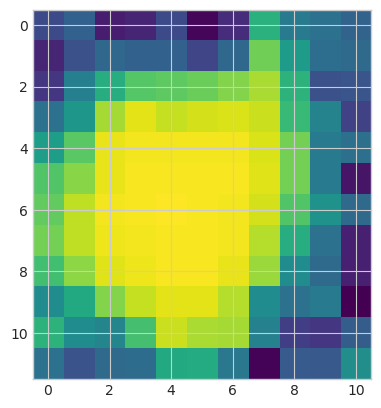

In [81]:
import matplotlib.pyplot as plt

peak_region = 9 #10 #9

# Plot
plt.imshow(mob_rt_examples[peak_region]['image'], cmap='viridis')

# Print the example
#print(mz_rt_examples[1]['df'].head())
#print(mz_rt_examples[1]['df'].shape)
print(mob_rt_examples[peak_region]['df'].head())

In [82]:
print("Minimum: ", mob_rt_examples[i]['pivot'].min().min())
print("Maximum: ", mob_rt_examples[i]['pivot'].max().max())

Minimum:  0.5058823529411764
Maximum:  0.996078431372549


### Modelfit

#### Johnson $S_u$

In [83]:
# import numpy as np
import tensorflow as tf

# --- 1. Datenvorbereitung ---
# Hol dir deine Peak-Region und baue daraus NumPy-Arrays
# peak_region = 10 #9

df = mob_rt_examples[peak_region]['df']

# X: (N_samples, 3), Y: (N_samples,)
X_np = df[['rt_values_min', 'mobility_values']].values.astype(np.float32)
Y_np = df['height'].values.astype(np.float32)
sum_intensities = np.sum(Y_np**2)

# In TensorFlow konvertieren
X = tf.constant(X_np)                  # shape [N, 2] <- (rt_values_min, mobility_values) for all N samples
Y = tf.constant(Y_np)                  # shape [N] 

In [84]:
def train(params, dichte, epochs = 100000, learning_rate=1e-2):

    def loss_fn(params):
        rho = dichte(params, X)        # Vorhersagen [N]
        # mittlere quadratische Abweichung, normalisiert durch Summe aller Intensitäten
        mse = tf.reduce_sum((Y - rho)**2) / sum_intensities
        return mse

    # --- 4. Optimizer und Trainingsschleife ---
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

    # Anzahl der Iterationen / Epochen
    #epochs = 20000

    old_loss = np.inf
    opt_params = None

    for epoch in range(epochs):
        with tf.GradientTape() as tape:
            loss = loss_fn(params)
        grads = tape.gradient(loss, [params])
        optimizer.apply_gradients(zip(grads, [params]))

        if loss.numpy() < old_loss:
            # Speichere die besten Parameter und den besten Verlust
            old_loss = loss.numpy()
            opt_params = params.numpy()

        if epoch % 200 == 0:
            print(f"Epoch {epoch:4d}, Loss = {loss.numpy():.6e}, Best Loss = {old_loss:.6e}")

    # --- 5. Ergebnisse ausgeben ---
    print("Optimierte Parameter:", opt_params)
    opt_loss = loss_fn(tf.convert_to_tensor(opt_params, dtype=tf.float32)).numpy()
    print("Finaler Fehler:", opt_loss)
    return opt_params

# Modelling Part

In [85]:
# --- 3. Modell- und Fehlerfunktion definieren ---
def jsu_likelihood(params, X):
    
    # parameter length
    n = int(-3/2+ np.sqrt(5/4 + len(params.numpy())))
    # 0: alpha
    alpha = params[0]
    # gamma
    gamma = params[1:1+n]
    # zeta
    zeta = params[1+n:1+2*n]
    # delta (absolut)
    delta = tf.abs(params[1+2*n:1+3*n])
    # A-Matrix (3×3), Q = A·Aᵀ
    A = tf.reshape(params[1+3*n:], (n, n))
    #Q = tf.matmul(A, A, transpose_b=True)  # Q = A @ A.T

    # Achsentransformation: für jeden Sample-Vektor x: Q @ (x - zeta)
    centered = X - zeta                   # broadcast [N,2] - [2] → [N,2]
    transformed = tf.matmul(centered, A, transpose_b=True)  # [N,2]

    # Komponentendichten
    # rho_i = exp(-0.5*(γ_i + δ_i*asinh(t_i))²) / sqrt(1 + t_i²)
    asinh_t = tf.asinh(transformed)      # [N,2]
    exponent = -0.5 * (gamma + delta * asinh_t)**2  # broadcast [2]→[N,2]
    rho_components = tf.exp(exponent) / tf.sqrt(1 + transformed**2)  # [N,2]

    # Gesamt-Wahrscheinlichkeit: α * ∏ₖ ρₖ
    rho = alpha * tf.reduce_prod(rho_components, axis=1)  # [N]
    return rho

Visualisierung

In [86]:
# # --- 2. Parameter als trainierbare Variablen ---
# dimensions = 2
# number_parameters = dimensions ** 2 + 3*dimensions + 1
# params = tf.Variable(tf.random.normal([number_parameters], stddev=0.1), name="params")

# Anzahl der Iterationen / Epochen
epochs = 20000

# params_jsu_likelihood = train(params, jsu_likelihood, epochs)

# # --- 5. Ergebnisse ausgeben ---
# print("Optimierte Parameter:", params_jsu_likelihood)
# alpha_opt = params_jsu_likelihood[0]
# print("Alpha:", alpha_opt)
# gamma_opt = params_jsu_likelihood[1:1+dimensions]
# print("Gamma:", gamma_opt)
# zeta_opt = params_jsu_likelihood[1+dimensions:1+2*dimensions]
# print("Zeta:", zeta_opt)
# delta_opt = np.abs(params_jsu_likelihood[1+2*dimensions:1+3*dimensions])
# print("Delta:", delta_opt)
# A_opt = np.reshape(opt_params[1+3*dimensions:], (dimensions, dimensions))
# print("A-Matrix:", A_opt)
# opt_loss = loss_fn(tf.convert_to_tensor(opt_params, dtype=tf.float32)).numpy()
# print("Finaler Fehler:", opt_loss)


In [87]:
def jsu_likelihood_refined(params_vector, X):
    """
    Calculates the JSU-based peak height for 2D input X.
    Ensures the function represents a single peak with controllable
    center, covariance, skewness, and kurtosis.

    Args:
        params_vector (tf.Tensor): A 1D tensor of 10 trainable parameters:
            [log_alpha,      # Log of amplitude
             mu_x, mu_y,     # Peak center
             log_l11, l21, log_l22,  # Params for Cholesky factor of covariance Q_cov
                                     # L_cov = [[exp(log_l11), 0],
                                     #          [l21, exp(log_l22)]]
             gamma_1, gamma_2,       # Skewness parameters
             log_delta_1, log_delta_2 # Log of kurtosis-related parameters
            ]
        X (tf.Tensor): Input data of shape [N_samples, 2].

    Returns:
        tf.Tensor: Predicted peak heights `rho` of shape [N_samples].
    """
    # parameter length
    n = int(-3/2+ np.sqrt(5/4 + len(params_vector.numpy())))

    # 1. Unpack and transform parameters from the flat params_vector
    log_alpha = params_vector[0]
    alpha = tf.exp(log_alpha)               # Amplitude, ensured > 0

    mu = params_vector[1:3]                 # Center [mu_x, mu_y]

    log_l11_chol = params_vector[3]         # Cholesky factor L_cov parameters
    l21_chol = params_vector[4]
    log_l22_chol = params_vector[5]

    gamma = params_vector[6:8]              # Skewness parameters [gamma_1, gamma_2]

    log_delta = params_vector[8:10]
    delta = tf.exp(log_delta)               # Kurtosis parameters [delta_1, delta_2], ensured > 0

    # 2. Construct the transformation matrix M_transform = (L_cov_inv).T
    # L_cov is the Cholesky factor of the covariance matrix Q_cov = L_cov @ L_cov.T
    # L_cov = [[l11,   0],
    #          [l21, l22]]
    l11 = tf.exp(log_l11_chol)  # Diagonal elements of L_cov must be positive
    l22 = tf.exp(log_l22_chol)
    # l21 is l21_chol (no transformation needed for off-diagonal)

    # Inverse of L_cov: L_cov_inv = [[1/l11, 0], [-l21/(l11*l22), 1/l22]]
    inv_l11 = 1.0 / l11
    inv_l22 = 1.0 / l22

    # M_transform = (L_cov_inv).T
    # M_transform = [[1/l11,            -l21/(l11*l22)],
    #                [0,                1/l22         ]]
    m00 = inv_l11
    m01 = -l21_chol * inv_l11 * inv_l22 # Element (0,1) of M_transform
    m10 = tf.constant(0.0, dtype=X.dtype) # Element (1,0) of M_transform
    m11 = inv_l22                       # Element (1,1) of M_transform

    # Construct M_transform as a 2x2 matrix
    # M_transform = tf.stack([tf.stack([m00, m10]), tf.stack([m01, m11])], axis=0) # if M is row-major
    M_transform_col1 = tf.stack([m00, m10]) # Column 0 of M_transform
    M_transform_col2 = tf.stack([m01, m11]) # Column 1 of M_transform
    M_transform = tf.stack([M_transform_col1, M_transform_col2], axis=1) # Stacks columns to form M

    # 3. Axis Transformation: t = (X - mu) @ M_transform
    centered = X - mu                                       # Broadcast [N,2] - [2] -> [N,2]
    transformed = tf.matmul(centered, M_transform)          # [N,2] @ [2,2] -> [N,2]

    # 4. Component densities (JSU formulation)
    # rho_i = exp(-0.5*(gamma_i + delta_i*asinh(t_i))**2) / sqrt(1 + t_i**2)
    asinh_t = tf.asinh(transformed)                         # [N,2]
    exponent = -0.5 * (gamma + delta * asinh_t)**2          # Broadcasts [2] with [N,2] -> [N,2]
    rho_components = tf.exp(exponent) / tf.sqrt(1.0 + transformed**2)  # [N,2]

    # 5. Overall "likelihood" or scaled peak height: alpha * Product_k rho_k
    # The factor |det(M_transform)| = 1 / |det(L_cov)| = 1 / (l11 * l22) would be
    # needed for a normalized PDF. Here, alpha absorbs this scaling.
    rho_unscaled_product = tf.reduce_prod(rho_components, axis=1)  # [N]
    rho = alpha * rho_unscaled_product                             # [N]

    return rho

# a mixture of JSU peak models

In [88]:
# --- Mixture of JSU Likelihoods ---
def jsu_mixture_likelihood(all_params_vector, X, num_components):
    """
    Calculates the output of a mixture of JSU peak models.

    Args:
        all_params_vector (tf.Tensor): A 1D tensor containing all parameters for the mixture:
            - First `num_components` elements are raw logits for mixture weights.
            - Next `num_components * 10` elements are parameters for each JSU component,
              concatenated (10 for comp1, 10 for comp2, ...).
        X (tf.Tensor): Input data of shape [N_samples, 2].
        num_components (int): The number of JSU components in the mixture.

    Returns:
        tf.Tensor: Predicted peak heights `phi_mix` of shape [N_samples].
    """
    # expected_param_count = num_components + num_components * 10

    # 1. Unpack mixture weight logits and component parameters
    raw_mixture_weights = all_params_vector[:num_components]
    jsu_component_params_flat = all_params_vector[num_components:]

    # print(f'length params flat: : {len(jsu_component_params_flat)}, length weight: {len(raw_mixture_weights)}, params : {jsu_component_params_flat}')

    # 2. Calculate mixture weights using softmax
    mixture_weights = tf.nn.softmax(raw_mixture_weights) # Shape [num_components]

    # 3. Calculate likelihood from each component
    component_likelihoods_list = []
    for k in range(num_components):
        start_idx = k * 10
        end_idx = start_idx + 10
        params_k = jsu_component_params_flat[start_idx:end_idx]
        # print(f'start_idx : {start_idx}, end_idx : {end_idx}, length : {len(params_k)}, params_k : {params_k}')
        rho_k = jsu_likelihood_refined(params_k, X) # Pass X to each
        component_likelihoods_list.append(rho_k) # rho_k has shape [N_samples]

    # Stack to get a tensor of shape [N_samples, num_components]
    all_component_likelihoods = tf.stack(component_likelihoods_list, axis=1)

    # 4. Compute the weighted sum
    # mixture_weights has shape [num_components]
    # all_component_likelihoods has shape [N_samples, num_components]
    # We want to multiply weights element-wise for each sample's components and sum
    # tf.reduce_sum will sum across the components dimension (axis=1)
    # Broadcasting: mixture_weights [K] will broadcast with [N, K] to effectively become [N, K]
    weighted_likelihoods = mixture_weights * all_component_likelihoods
    phi_mix = tf.reduce_sum(weighted_likelihoods, axis=1) # Shape [N_samples]

    return phi_mix

# Asymmetric Generalized Normal (AGN)

In [89]:
# Sigmoid function
def tf_sigmoid(x):
    return 1.0 / (1.0 + tf.exp(-x))

def agn_2d_peak(params_vector, X):
    """
    Calculates an Asymmetric Generalized Normal (AGN) based peak height for 2D input X.
    Allows for controllable center, covariance, skewness, and kurtosis (tail shape).

    Args:
        params_vector (tf.Tensor or compatible): A 1D tensor of 12 trainable parameters:
            [log_alpha,      # Log of amplitude
             mu_x, mu_y,     # Peak center
             log_l11, l21, log_l22,  # Params for Cholesky factor of covariance Q_cov
             log_sigma_1, log_sigma_2, # Log of scale parameters for t1, t2
             a_1, a_2,               # Skewness parameters for t1, t2
             log_p_1, log_p_2        # Log of shape (kurtosis) parameters for t1, t2
            ]
        X (tf.Tensor): Input data of shape [N_samples, 2].
        component_idx_for_debug (int): Optional identifier for debugging messages.

    Returns:
        tf.Tensor: Predicted peak heights `rho` of shape [N_samples].
    """

    # 1. Unpack and transform parameters
    log_alpha = params_vector[0]
    alpha = tf.exp(log_alpha)               # Amplitude, ensured > 0

    mu = params_vector[1:3]                 # Center [mu_x, mu_y]

    log_l11_chol = params_vector[3]
    l21_chol = params_vector[4]
    log_l22_chol = params_vector[5]

    log_sigma_params = params_vector[6:8]   # [log_sigma_1, log_sigma_2]
    sigma_agn = tf.exp(log_sigma_params)    # Scale parameters, ensured > 0

    a_skew_params = params_vector[8:10]     # Skewness parameters [a_1, a_2]

    log_p_shape_params = params_vector[10:12] # [log_p_1, log_p_2]
    p_shape = tf.exp(log_p_shape_params)    # Shape parameters, ensured > 0
                                            # Common range p_shape > 0.5 or p_shape > 1

    # 2. Construct the transformation matrix M_transform = (L_cov_inv).T
    l11 = tf.exp(log_l11_chol)
    l22 = tf.exp(log_l22_chol)
    epsilon = 1e-8 # For numerical stability

    inv_l11 = 1.0 / (l11 + epsilon)
    inv_l22 = 1.0 / (l22 + epsilon)
    m00 = inv_l11
    m01 = -l21_chol * inv_l11 * inv_l22
    m10 = tf.constant(0.0, dtype=X.dtype)
    m11 = inv_l22
    M_transform_col1 = tf.stack([m00, m10])
    M_transform_col2 = tf.stack([m01, m11])
    M_transform = tf.stack([M_transform_col1, M_transform_col2], axis=1)

    # 3. Axis Transformation: t_coords = (X - mu) @ M_transform
    centered = X - mu                                       # [N,2]
    t_coords = tf.matmul(centered, M_transform)             # [N,2], these are [t1, t2] for each sample

    # 4. Component densities based on the MATLAB formula (per dimension)
    # For each dimension i (0 or 1):
    # density_i = exp(-abs(t_i - x0_i)^p_i / sigma_i^p_i) * sigmoid(a_i*(t_i-x0_i)/sigma_i)
    # In our transformed space, the "center" x0 for t_i is 0.
    # So, abs(t_i - 0) = abs(t_i)

    # Term 1: exp(-abs(t_i)^p_i / sigma_i^p_i)
    abs_t_coords = tf.abs(t_coords)                         # [N,2]
    # Need to be careful with broadcasting for element-wise power
    # (abs_t_coords / sigma_agn) will broadcast sigma_agn [2] to [N,2]
    # Then raise to power p_shape (also broadcast)
    ratio_t_sigma = abs_t_coords / (sigma_agn + epsilon)    # Add epsilon to sigma_agn denominator
    # Element-wise power: tf.pow(base, exponent)
    # Ensure p_shape doesn't cause issues (e.g. very small or very large values)
    # Adding epsilon to p_shape if it can go to zero, though tf.exp(log_p) should prevent this.
    term1_exponent_val = tf.pow(ratio_t_sigma, p_shape)     # [N,2]
    term1 = tf.exp(-term1_exponent_val)                     # [N,2]

    # Term 2: sigmoid(a_i * t_i / sigma_i)
    # (t_coords / sigma_agn) is [N,2]
    # a_skew_params is [2]
    sigmoid_arg = a_skew_params * (t_coords / (sigma_agn + epsilon)) # [N,2]
    term2 = tf_sigmoid(sigmoid_arg)                         # [N,2]

    # Per-component (dimension) density before amplitude scaling
    rho_components = term1 * term2                          # [N,2]

    # 5. Overall "likelihood" or scaled peak height: alpha * Product_k rho_k
    # Note: This MATLAB formula is not a normalized PDF. The amplitude is implicitly handled
    # by the product and then explicitly by `alpha`.
    # If it were a PDF, a normalization constant involving sigma, p, and Gamma function
    # would be needed, and the sigmoid part would also need normalization.
    # Here, we treat it as a shape function scaled by alpha.
    rho_unscaled_product = tf.reduce_prod(rho_components, axis=1)  # [N]
    rho = alpha * rho_unscaled_product                             # [N]

    return rho

### Kurtosis adapted skew-normal with positive semidefinite Mixing :

\begin{equation}
p(x)=\alpha \prod_{i=1}^n e^{-\frac12 |y_i|^{p_i}} \Phi\left(\lambda_i y_i\right), \quad y=A(x-\zeta) .
\end{equation}

$\Phi$ is the gaussian CDF, $A$ is positive semidefinite

In [90]:
n =2
def kurtosis_skew_normal_spd_2D_mvd(params, X):
    alpha = params[0]
    p      = params[1:1+n]                # Exponenten
    zeta   = params[1+n:1+2*n]
    lam    = params[1+2*n:1+3*n]          # Schiefewinkel
    #A_flat = params[1+3*n:]
    #A      = tf.reshape(A_flat, (n,n))

    log_l11_chol = params[1+3*n]         # Cholesky factor L_cov parameters
    l21_chol = params[2+3*n]              # Off-diagonal Cholesky factor L_cov
    log_l22_chol = params[3+3*n]         # Cholesky factor L_cov parameters


    # 2. Construct the transformation matrix M_transform = (L_cov_inv).T
    # L_cov is the Cholesky factor of the covariance matrix Q_cov = L_cov @ L_cov.T
    # L_cov = [[l11,   0],
    #          [l21, l22]]
    l11 = tf.exp(log_l11_chol)  # Diagonal elements of L_cov must be positive
    l22 = tf.exp(log_l22_chol)
    # l21 is l21_chol (no transformation needed for off-diagonal)

    # Inverse of L_cov: L_cov_inv = [[1/l11, 0], [-l21/(l11*l22), 1/l22]]
    inv_l11 = 1.0 / l11
    inv_l22 = 1.0 / l22

    # M_transform = (L_cov_inv).T
    # M_transform = [[1/l11,            -l21/(l11*l22)],
    #                [0,                1/l22         ]]
    m00 = inv_l11
    m01 = -l21_chol * inv_l11 * inv_l22 # Element (0,1) of M_transform
    m10 = tf.constant(0.0, dtype=X.dtype) # Element (1,0) of M_transform
    m11 = inv_l22                       # Element (1,1) of M_transform

    # Construct M_transform as a 2x2 matrix
    # M_transform = tf.stack([tf.stack([m00, m10]), tf.stack([m01, m11])], axis=0) # if M is row-major
    M_transform_col1 = tf.stack([m00, m10]) # Column 0 of M_transform
    M_transform_col2 = tf.stack([m01, m11]) # Column 1 of M_transform
    A = tf.stack([M_transform_col1, M_transform_col2], axis=1) # Stacks columns to form M


    centered = X - zeta
    Y        = tf.matmul(centered, A, transpose_b=True)

    # Standard-Normal-Dichte und -Verteilungsfunktion
    phi = tf.exp(-0.5*tf.pow(tf.abs(Y),p))/tf.sqrt(2*tf.constant(np.pi))
    Phi = 0.5*(1 + tf.math.erf(lam*Y/tf.sqrt(2.0)))

    rho_comp = phi*Phi
    rho = alpha * tf.reduce_prod(rho_comp, axis=1)
    return rho

#### Normalverteilung

\begin{equation}
p(x)=\alpha \exp \left(-\frac{1}{2} y^{\top} y\right), \quad y=A(x-\zeta) .
\end{equation}

In [91]:
# --- Parameterzahl und Variablen ---
n = 2

def normal_mvd(params, X):
    alpha = params[0]
    zeta  = params[1:1+n]
    # A_flat= params[1+n:]
    # A     = tf.reshape(A_flat, (n,n))

    log_l11_chol = params[1+n]         # Cholesky factor L_cov parameters
    l21_chol = params[2+n]              # Off-diagonal Cholesky factor L_cov
    log_l22_chol = params[3+n]         # Cholesky factor L_cov parameters


    # 2. Construct the transformation matrix M_transform = (L_cov_inv).T
    # L_cov is the Cholesky factor of the covariance matrix Q_cov = L_cov @ L_cov.T
    # L_cov = [[l11,   0],
    #          [l21, l22]]
    l11 = tf.exp(log_l11_chol)  # Diagonal elements of L_cov must be positive
    l22 = tf.exp(log_l22_chol)
    # l21 is l21_chol (no transformation needed for off-diagonal)

    # Inverse of L_cov: L_cov_inv = [[1/l11, 0], [-l21/(l11*l22), 1/l22]]
    inv_l11 = 1.0 / l11
    inv_l22 = 1.0 / l22

    # M_transform = (L_cov_inv).T
    # M_transform = [[1/l11,            -l21/(l11*l22)],
    #                [0,                1/l22         ]]
    m00 = inv_l11
    m01 = -l21_chol * inv_l11 * inv_l22 # Element (0,1) of M_transform
    m10 = tf.constant(0.0, dtype=X.dtype) # Element (1,0) of M_transform
    m11 = inv_l22                       # Element (1,1) of M_transform

    # Construct M_transform as a 2x2 matrix
    # M_transform = tf.stack([tf.stack([m00, m10]), tf.stack([m01, m11])], axis=0) # if M is row-major
    M_transform_col1 = tf.stack([m00, m10]) # Column 0 of M_transform
    M_transform_col2 = tf.stack([m01, m11]) # Column 1 of M_transform
    A = tf.stack([M_transform_col1, M_transform_col2], axis=1) # Stacks columns to form M

    centered = X - zeta
    Y        = tf.matmul(centered, A, transpose_b=True)  # [N,n]

    # univariate Normal (bis auf Konstanten): exp(-½ z^2)
    rho_comp = tf.exp(-0.5 * Y**2)                        # [N,n]

    rho = alpha * tf.reduce_prod(rho_comp, axis=1)       # [N]
    return rho

#### Pearson type IV as general distributions

The normal distribution is the limit

##### IV

\begin{equation}
\rho_i(y) \propto\left(1+y_i^2 / \nu_i\right)^{-m_i} \exp \left(n_i \arctan \left(y_i / \sqrt{\nu_i}\right)\right)
\end{equation}

In [92]:
def pearsonIV_mvd(params, X):
    alpha = params[0]
    zeta   = params[1:1+n]
    m      = tf.nn.softplus(params[1+n:1+2*n])         # m>0
    npar   = params[1+2*n:1+3*n]                       # n real
    nu     = tf.nn.softplus(params[1+3*n:1+4*n])       # ν>0
    
    # A_flat = params[1+4*n:]
    # A      = tf.reshape(A_flat,(n,n))

    log_l11_chol = params[1+4*n]         # Cholesky factor L_cov parameters
    l21_chol = params[2+4*n]              # Off-diagonal Cholesky factor L_cov
    log_l22_chol = params[3+4*n]         # Cholesky factor L_cov parameters


    # 2. Construct the transformation matrix M_transform = (L_cov_inv).T
    # L_cov is the Cholesky factor of the covariance matrix Q_cov = L_cov @ L_cov.T
    # L_cov = [[l11,   0],
    #          [l21, l22]]
    l11 = tf.exp(log_l11_chol)  # Diagonal elements of L_cov must be positive
    l22 = tf.exp(log_l22_chol)
    # l21 is l21_chol (no transformation needed for off-diagonal)

    # Inverse of L_cov: L_cov_inv = [[1/l11, 0], [-l21/(l11*l22), 1/l22]]
    inv_l11 = 1.0 / l11
    inv_l22 = 1.0 / l22

    # M_transform = (L_cov_inv).T
    # M_transform = [[1/l11,            -l21/(l11*l22)],
    #                [0,                1/l22         ]]
    m00 = inv_l11
    m01 = -l21_chol * inv_l11 * inv_l22 # Element (0,1) of M_transform
    m10 = tf.constant(0.0, dtype=X.dtype) # Element (1,0) of M_transform
    m11 = inv_l22                       # Element (1,1) of M_transform

    # Construct M_transform as a 2x2 matrix
    # M_transform = tf.stack([tf.stack([m00, m10]), tf.stack([m01, m11])], axis=0) # if M is row-major
    M_transform_col1 = tf.stack([m00, m10]) # Column 0 of M_transform
    M_transform_col2 = tf.stack([m01, m11]) # Column 1 of M_transform
    A = tf.stack([M_transform_col1, M_transform_col2], axis=1) # Stacks columns to form M

    centered = X - zeta
    Y = tf.matmul(centered, A, transpose_b=True)

    # pearson IV
    term1 = (1 + (Y**2)/nu)**(-m)
    term2 = tf.exp(npar * tf.atan(Y/tf.sqrt(nu)))
    rho_i = term1 * term2
    rho = alpha * tf.reduce_prod(rho_i, axis=1)
    return rho


In [93]:
from matplotlib.colors import Normalize
from mpl_toolkits.mplot3d import Axes3D  # muss importiert sein, auch wenn nicht direkt verwendet

def plot(params, dichte):
    first_axis = 'rt_values_min'
    second_axis = 'mobility_values'

    if second_axis == 'mobility_values':
        df = mob_rt_examples[peak_region]['df'].copy()
        Z = mob_rt_examples[peak_region]['image'].copy()
    elif second_axis == 'mz_values':
        df = mz_rt_examples[peak_region]['df'].copy()
        Z = mz_rt_examples[peak_region]['image'].copy()

    # Get sampling points
    exec("X_np = df[['%s', '%s']].values.astype(np.float32)" % (first_axis, second_axis))
    # estimate function value
    df['height'] = dichte(tf.convert_to_tensor(params, dtype=tf.float32), X_np).numpy() 

    pivot = df.pivot(
            index=second_axis,
            columns=first_axis,
            values='height'    
        )
    estimate = pivot.values 


    x = pivot.columns.values     # Länge = n_mz
    y = pivot.index.values       # Länge = n_rt

    # 1) Gitter erstellen
    X_mesh, Y_mesh = np.meshgrid(x, y)

    # 2) gemeinsame Farbskalierung von 0…1
    norm = Normalize(vmin=0, vmax=1)

    # 3) Figure und 3D-Achse
    fig, axes = plt.subplots(
        1, 3, 
        subplot_kw={'projection': '3d'}, 
        figsize=(20, 6)
    )

    for ax, Zdata, title in zip(
        axes,
        [Z, np.abs(Z - estimate), estimate],
        ['Original', 'Difference', 'Estimate']
    ):
        surf = ax.plot_surface(X_mesh, Y_mesh, Zdata, cmap='viridis', norm=norm)
        ax.set_xlabel(first_axis)
        ax.set_ylabel(second_axis)
        ax.set_zlabel('height')
        ax.set_title(title)

    # gemeinsame Colorbar
    fig.colorbar(surf, ax=axes.tolist(), shrink=0.5, aspect=10, label='height')
    plt.show()

In [94]:
# --- Parameter initialization (10 parameters for n=2) ---
# Sensible initial values might be better than pure random normal, e.g.,
# log_alpha ~ 0 (alpha ~ 1)
# mu_x, mu_y ~ center of data
# log_l11, log_l22 ~ 0 (l11, l22 ~ 1, so initial covariance is identity-like)
# l21 ~ 0 (no initial correlation)
# gamma ~ 0 (no initial skew)
# log_delta ~ log(1) or log(2) (delta ~ 1 or 2, JSU is flexible)
initial_params_guess = [
    0.0,  # log_alpha
    tf.reduce_mean(X[:,0]).numpy(), tf.reduce_mean(X[:,1]).numpy(), # mu_x, mu_y
    0.0, 0.0, 0.0,  # log_l11, l21, log_l22 (for identity-like initial covariance)
    0.0, 0.0,       # gamma_1, gamma_2 (no skew)
    tf.math.log(2.0).numpy(), tf.math.log(2.0).numpy() # log_delta_1, log_delta_2 (delta ~ 2)
]
# params_tf_var = tf.Variable(tf.random.normal([number_parameters_refined], stddev=0.1, dtype=tf.float32), name="params_refined")
params_tf_var = tf.Variable(initial_params_guess, dtype=tf.float32, name="params_refined")

params_jsu_likelihood_refined = train(params_tf_var, jsu_likelihood_refined, epochs)

# # --- 5. Ergebnisse ausgeben ---
# print("Optimierte Parameter:", params_jsu_likelihood_refined)
# alpha_opt_jsu_likelihood_refined = tf.exp(params_jsu_likelihood_refined[0])
# print("Alpha:", alpha_opt_jsu_likelihood_refined)
# gamma_opt_jsu_likelihood_refined = params_jsu_likelihood_refined[6:8]
# print("Gamma:", gamma_opt_jsu_likelihood_refined)
# mu_opt_jsu_likelihood_refined = params_jsu_likelihood_refined[1:3]
# print("mu:", mu_opt_jsu_likelihood_refined)
# delta_opt_jsu_likelihood_refined = tf.exp(params_jsu_likelihood_refined[8:10])
# print("Delta:", delta_opt_jsu_likelihood_refined)

Epoch    0, Loss = 7.895301e-02, Best Loss = 7.895301e-02
Epoch  200, Loss = 2.178738e-02, Best Loss = 2.178738e-02
Epoch  400, Loss = 7.620203e-03, Best Loss = 7.612464e-03
Epoch  600, Loss = 7.600542e-03, Best Loss = 7.600542e-03
Epoch  800, Loss = 7.641489e-03, Best Loss = 7.599603e-03
Epoch 1000, Loss = 7.598071e-03, Best Loss = 7.597954e-03
Epoch 1200, Loss = 7.598102e-03, Best Loss = 7.597202e-03
Epoch 1400, Loss = 7.655831e-03, Best Loss = 7.596156e-03
Epoch 1600, Loss = 7.594573e-03, Best Loss = 7.594474e-03
Epoch 1800, Loss = 7.684533e-03, Best Loss = 7.593109e-03
Epoch 2000, Loss = 7.628581e-03, Best Loss = 7.591683e-03
Epoch 2200, Loss = 7.612086e-03, Best Loss = 7.590699e-03
Epoch 2400, Loss = 7.712669e-03, Best Loss = 7.589047e-03
Epoch 2600, Loss = 7.657165e-03, Best Loss = 7.587698e-03
Epoch 2800, Loss = 7.744268e-03, Best Loss = 7.585933e-03
Epoch 3000, Loss = 7.612563e-03, Best Loss = 7.584137e-03
Epoch 3200, Loss = 7.669771e-03, Best Loss = 7.582056e-03
Epoch 3400, Lo

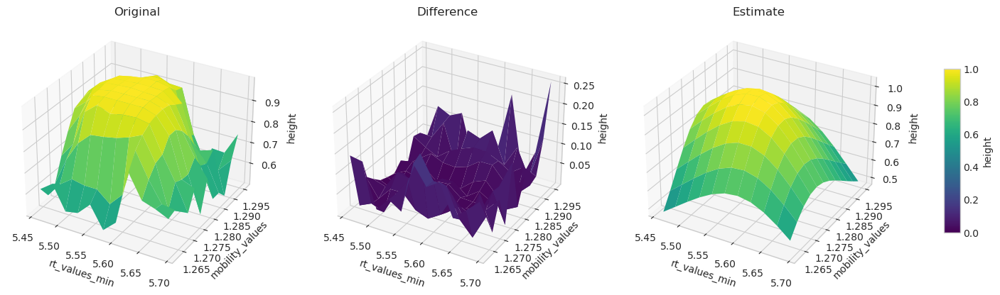

In [95]:
plot(params_jsu_likelihood_refined, jsu_likelihood_refined)

In [96]:
initial_params_guess_agn = [
        0.0,  # log_alpha (alpha ~ 1)
        tf.reduce_mean(X[:,0]).numpy(), tf.reduce_mean(X[:,1]).numpy(), # mu_x, mu_y (centered)
        tf.math.log(1.0).numpy(), 0.0, tf.math.log(1.0).numpy(),  # L_cov for identity-like covariance
        tf.math.log(1.0).numpy(), tf.math.log(1.0).numpy(), # log_sigma_1, log_sigma_2 (sigma ~ 1)
        0.0, 0.0,       # a_1, a_2 (no initial skew)
        tf.math.log(2.0).numpy(), tf.math.log(2.0).numpy()  # log_p_1, log_p_2 (p ~ 2, Gaussian-like tails)
    ]

params_agn_tf_var = tf.Variable(initial_params_guess_agn, dtype=tf.float32, name="params_agn")

# # Anzahl der Iterationen / Epochen
# epochs = 40000

params_agn_tf_var = train(params_agn_tf_var, agn_2d_peak, epochs)

# # --- 5. Ergebnisse ausgeben ---
# print("Optimierte Parameter:", params_agn_tf_var)
# alpha_opt_agn_tf_var = tf.exp(params_agn_tf_var[0])
# print("Alpha:", alpha_opt_agn_tf_var)
# gamma_opt_agn_tf_var = params_agn_tf_var[6:8]
# print("Gamma:", gamma_opt_agn_tf_var)
# mu_opt_agn_tf_var = params_agn_tf_var[1:3]
# print("mu:", mu_opt_agn_tf_var)
# sigma_opt_agn_tf_var = tf.exp(params_agn_tf_var[6:8])
# print("sigma:", mu_opt_agn_tf_var)
# a_skew_opt_agn_tf_var = params_agn_tf_var[8:10]
# print("a_skew:", a_skew_opt_agn_tf_var)
# p_shape_opt_agn_tf_var = tf.exp(params_agn_tf_var[10:12])
# print("p:", p_shape_opt_agn_tf_var)
# delta_opt_agn_tf_var = tf.exp(params_agn_tf_var[8:10])
# print("Delta:", delta_opt_agn_tf_var)

Epoch    0, Loss = 4.962176e-01, Best Loss = 4.962176e-01
Epoch  200, Loss = 2.426919e-02, Best Loss = 2.426919e-02
Epoch  400, Loss = 2.342437e-02, Best Loss = 2.342437e-02
Epoch  600, Loss = 2.305424e-02, Best Loss = 2.305424e-02
Epoch  800, Loss = 2.288498e-02, Best Loss = 2.288498e-02
Epoch 1000, Loss = 2.275693e-02, Best Loss = 2.275693e-02
Epoch 1200, Loss = 2.264572e-02, Best Loss = 2.264572e-02
Epoch 1400, Loss = 2.252555e-02, Best Loss = 2.252555e-02
Epoch 1600, Loss = 2.233401e-02, Best Loss = 2.233401e-02
Epoch 1800, Loss = 2.160089e-02, Best Loss = 2.140450e-02
Epoch 2000, Loss = 1.724253e-02, Best Loss = 1.217662e-02
Epoch 2200, Loss = 8.434172e-03, Best Loss = 8.434172e-03
Epoch 2400, Loss = 6.928306e-03, Best Loss = 6.928306e-03
Epoch 2600, Loss = 6.902162e-03, Best Loss = 6.889757e-03
Epoch 2800, Loss = 6.898063e-03, Best Loss = 6.884513e-03
Epoch 3000, Loss = 6.982290e-03, Best Loss = 6.880208e-03
Epoch 3200, Loss = 6.911106e-03, Best Loss = 6.876133e-03
Epoch 3400, Lo

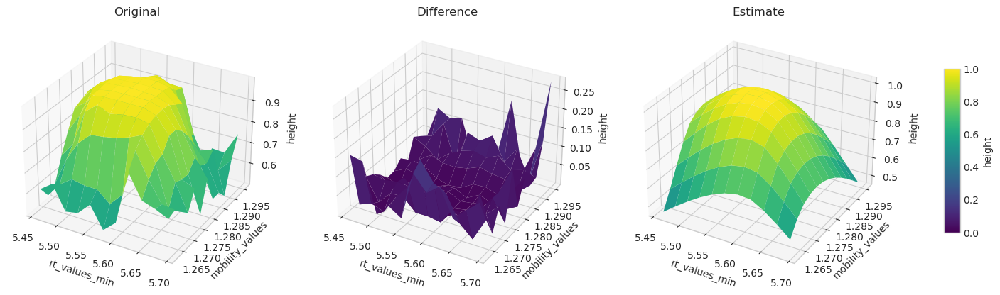

In [97]:
plot(params_agn_tf_var, agn_2d_peak)

In [98]:
# alpha, zeta(n), shape λ(n), A(n×n)
num_params = 1 + 2*n + n + n*n - 1
params = tf.Variable(tf.random.normal([num_params], stddev=0.1), name="sn_params")

# # Indizes 1 bis 1+n
indices = tf.range(1, 1 + n, dtype=tf.int32)
updates = tf.fill([n], 2.0)

# Scatter Update
updated_params = tf.tensor_scatter_nd_update(params, tf.reshape(indices, [-1, 1]), updates)
params.assign(updated_params)

params_kurtosis_skew_normal_spd_2D = train(params, kurtosis_skew_normal_spd_2D_mvd, epochs)



Epoch    0, Loss = 9.999999e-01, Best Loss = 9.999999e-01
Epoch  200, Loss = 9.999996e-01, Best Loss = 9.999996e-01
Epoch  400, Loss = 9.399039e-02, Best Loss = 9.399039e-02
Epoch  600, Loss = 3.491785e-02, Best Loss = 3.491785e-02
Epoch  800, Loss = 3.360743e-02, Best Loss = 3.360743e-02
Epoch 1000, Loss = 3.335180e-02, Best Loss = 3.335180e-02
Epoch 1200, Loss = 3.235764e-02, Best Loss = 3.235764e-02
Epoch 1400, Loss = 2.339194e-02, Best Loss = 2.263313e-02
Epoch 1600, Loss = 2.154209e-02, Best Loss = 2.154209e-02
Epoch 1800, Loss = 2.141206e-02, Best Loss = 2.129808e-02
Epoch 2000, Loss = 2.113020e-02, Best Loss = 2.112403e-02
Epoch 2200, Loss = 2.101552e-02, Best Loss = 2.093574e-02
Epoch 2400, Loss = 2.068463e-02, Best Loss = 2.068463e-02
Epoch 2600, Loss = 2.034645e-02, Best Loss = 2.034645e-02
Epoch 2800, Loss = 1.971257e-02, Best Loss = 1.971257e-02
Epoch 3000, Loss = 1.795043e-02, Best Loss = 1.795043e-02
Epoch 3200, Loss = 1.619750e-02, Best Loss = 1.619750e-02
Epoch 3400, Lo

KeyboardInterrupt: 

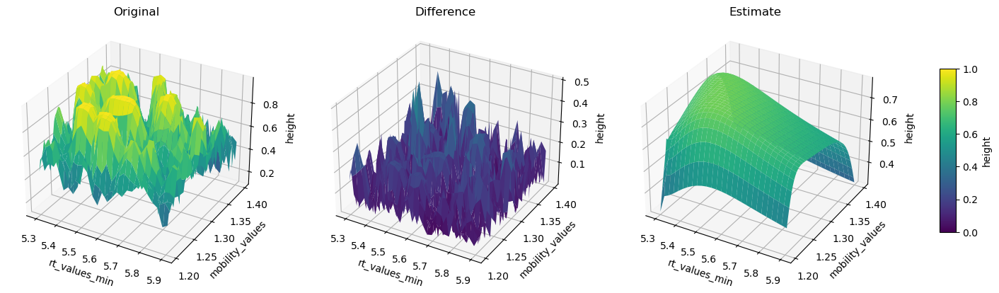

In [ ]:
plot(params_kurtosis_skew_normal_spd_2D, kurtosis_skew_normal_spd_2D_mvd)

In [ ]:
# params = [alpha, zeta(n), A(n×n)]
num_params = 1 + n + n*n - 1
params = tf.Variable(tf.random.normal([num_params], stddev=0.1), name="normal_params")

params_normal = train(params, normal_mvd, epochs)



Epoch    0, Loss = 1.000002e+00, Best Loss = 1.000002e+00


Epoch  200, Loss = 8.233356e-01, Best Loss = 8.233356e-01
Epoch  400, Loss = 6.959438e-02, Best Loss = 6.959438e-02
Epoch  600, Loss = 6.937812e-02, Best Loss = 6.937812e-02
Epoch  800, Loss = 6.918282e-02, Best Loss = 6.918282e-02
Epoch 1000, Loss = 6.896462e-02, Best Loss = 6.896462e-02
Epoch 1200, Loss = 6.867051e-02, Best Loss = 6.867051e-02
Epoch 1400, Loss = 6.799717e-02, Best Loss = 6.799717e-02
Epoch 1600, Loss = 5.723138e-02, Best Loss = 5.722282e-02
Epoch 1800, Loss = 5.717237e-02, Best Loss = 5.717237e-02
Epoch 2000, Loss = 5.714076e-02, Best Loss = 5.714076e-02
Epoch 2200, Loss = 5.710967e-02, Best Loss = 5.710967e-02
Epoch 2400, Loss = 5.707869e-02, Best Loss = 5.707869e-02
Epoch 2600, Loss = 5.704746e-02, Best Loss = 5.704746e-02
Epoch 2800, Loss = 5.701575e-02, Best Loss = 5.701575e-02
Epoch 3000, Loss = 5.698344e-02, Best Loss = 5.698344e-02
Epoch 3200, Loss = 5.695045e-02, Best Loss = 5.695045e-02
Epoch 3400, Loss = 5.691680e-02, Best Loss = 5.691680e-02
Epoch 3600, Lo

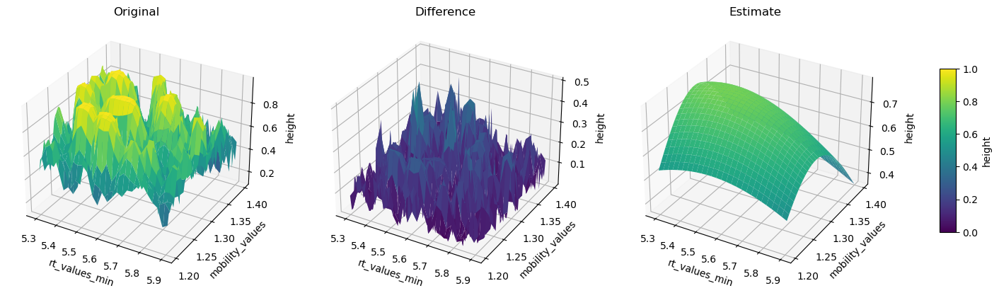

In [ ]:
plot(params_normal, normal_mvd)

In [ ]:
# alpha, zeta(n), shape λ(n), A(n×n)
num_params = 1 + n + n + n + n + n*n - 1
params = tf.Variable(tf.random.normal([num_params], stddev=0.1), name="sn_params")
#params[1:1+n] = 2.0 # Initialisierung der Exponenten auf 2.0
# Indizes 1 bis 1+n
indices = tf.range(1, 1 + n, dtype=tf.int32)
updates = tf.fill([n], 2.0)

# Scatter Update
updated_params = tf.tensor_scatter_nd_update(params, tf.reshape(indices, [-1, 1]), updates)
params.assign(updated_params)

params_pearson_IV = train(params, pearsonIV_mvd, epochs)

Epoch    0, Loss = 1.015434e+00, Best Loss = 1.015434e+00


Epoch  200, Loss = 7.037191e-02, Best Loss = 7.037191e-02
Epoch  400, Loss = 6.968728e-02, Best Loss = 6.968728e-02
Epoch  600, Loss = 6.906275e-02, Best Loss = 6.906275e-02
Epoch  800, Loss = 6.652535e-02, Best Loss = 6.652535e-02
Epoch 1000, Loss = 5.653426e-02, Best Loss = 5.653426e-02
Epoch 1200, Loss = 5.626574e-02, Best Loss = 5.626574e-02
Epoch 1400, Loss = 5.615567e-02, Best Loss = 5.615567e-02
Epoch 1600, Loss = 5.611745e-02, Best Loss = 5.611745e-02
Epoch 1800, Loss = 5.610566e-02, Best Loss = 5.609819e-02
Epoch 2000, Loss = 5.608286e-02, Best Loss = 5.608159e-02
Epoch 2200, Loss = 5.606798e-02, Best Loss = 5.606798e-02
Epoch 2400, Loss = 5.605486e-02, Best Loss = 5.605486e-02
Epoch 2600, Loss = 5.603853e-02, Best Loss = 5.603853e-02
Epoch 2800, Loss = 5.601016e-02, Best Loss = 5.601016e-02
Epoch 3000, Loss = 5.590862e-02, Best Loss = 5.590862e-02
Epoch 3200, Loss = 5.459454e-02, Best Loss = 5.459454e-02
Epoch 3400, Loss = 5.449166e-02, Best Loss = 5.449166e-02
Epoch 3600, Lo

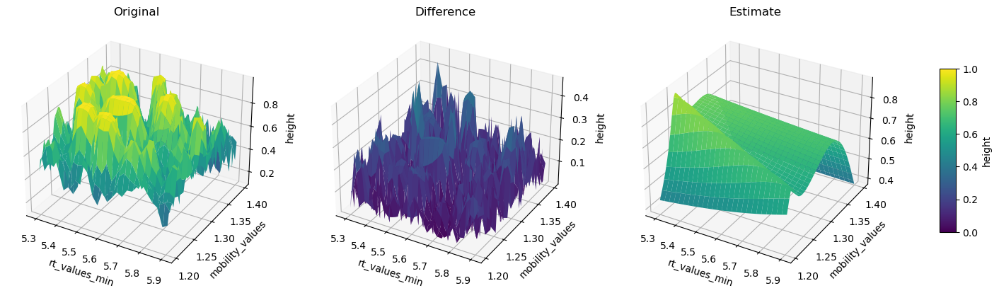

In [ ]:
plot(params_pearson_IV, pearsonIV_mvd)

In [ ]:
first_axis = 'rt_values_min'
second_axis = 'mobility_values'

if second_axis == 'mobility_values':
    df = mob_rt_examples[peak_region]['df'].copy()
    Z = mob_rt_examples[peak_region]['image'].copy()
elif second_axis == 'mz_values':
    df = mz_rt_examples[peak_region]['df'].copy()
    Z = mz_rt_examples[peak_region]['image'].copy()

# Get sampling points
exec("X_np = df[['%s', '%s']].values.astype(np.float32)" % (first_axis, second_axis))
# estimate function value


df['height_jsu'] = jsu_likelihood_refined(tf.convert_to_tensor(params_jsu_likelihood_refined, dtype=tf.float32), X_np).numpy() 
df['height_agn'] = agn_2d_peak(tf.convert_to_tensor(params_agn_tf_var, dtype=tf.float32), X_np).numpy() 
df['height_kurtosis'] = kurtosis_skew_normal_spd_2D_mvd(tf.convert_to_tensor(params_kurtosis_skew_normal_spd_2D, dtype=tf.float32), X_np).numpy() 
df['height_normal'] = normal_mvd(tf.convert_to_tensor(params_normal, dtype=tf.float32), X_np).numpy() 
df['height_pearson'] = pearsonIV_mvd(tf.convert_to_tensor(params_pearson_IV, dtype=tf.float32), X_np).numpy() 

pivot_jsu = df.pivot(
        index=second_axis,
        columns=first_axis,
        values='height_jsu'    
    )
estimate_jsu = pivot_jsu.values 


x_jsu = pivot_jsu.columns.values     # Länge = n_mz
y_jsu = pivot_jsu.index.values       # Länge = n_rt

# ===========================
pivot_agn = df.pivot(
        index=second_axis,
        columns=first_axis,
        values='height_agn'    
    )
estimate_agn = pivot_agn.values 


x_agn = pivot_agn.columns.values     # Länge = n_mz
y_agn = pivot_agn.index.values       # Länge = n_rt
# ===========================
pivot_kur = df.pivot(
        index=second_axis,
        columns=first_axis,
        values='height_kurtosis'    
    )
estimate_kur = pivot_kur.values 


x_kur = pivot_kur.columns.values     # Länge = n_mz
y_kur = pivot_kur.index.values       # Länge = n_rt
# ===========================
pivot_nor = df.pivot(
        index=second_axis,
        columns=first_axis,
        values='height_normal'    
    )
estimate_nor = pivot_nor.values 


x_nor = pivot_nor.columns.values     # Länge = n_mz
y_nor = pivot_nor.index.values       # Länge = n_rt
# ===========================
pivot_pear = df.pivot(
        index=second_axis,
        columns=first_axis,
        values='height_pearson'    
    )
estimate_pear = pivot_pear.values 


x_pear = pivot_pear.columns.values     # Länge = n_mz
y_pear = pivot_pear.index.values       # Länge = n_rt
# ===========================

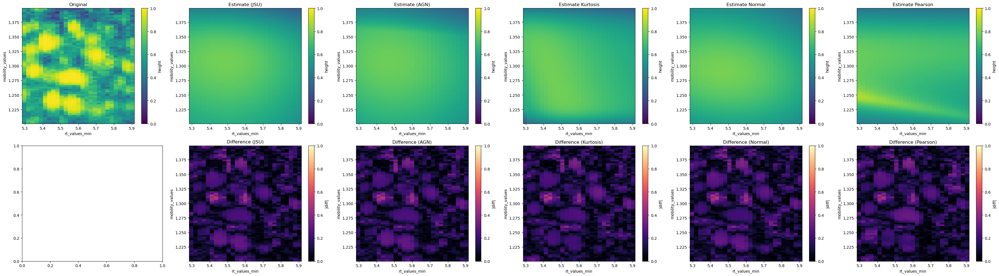

In [ ]:
fig, ax = plt.subplots(2, 6, figsize=(36, 10))  # 2 rows, 6 columns

# Normalization from 0 to 1
norm = Normalize(vmin=0, vmax=1)

# ----------------- ROW 1: IMAGES -----------------
# Original
mesh0 = ax[0, 0].pcolormesh(x_jsu, y_jsu, Z, shading='auto', cmap='viridis', norm=norm)
fig.colorbar(mesh0, ax=ax[0, 0], label='height')
ax[0, 0].set_ylabel(second_axis)
ax[0, 0].set_xlabel(first_axis)
ax[0, 0].set_title('Original')

# JSU Estimate
mesh1 = ax[0, 1].pcolormesh(x_jsu, y_jsu, estimate_jsu, shading='auto', cmap='viridis', norm=norm)
fig.colorbar(mesh1, ax=ax[0, 1], label='height')
ax[0, 1].set_ylabel(second_axis)
ax[0, 1].set_xlabel(first_axis)
ax[0, 1].set_title('Estimate (JSU)')

# AGN Estimate
mesh2 = ax[0, 2].pcolormesh(x_agn, y_agn, estimate_agn, shading='auto', cmap='viridis', norm=norm)
fig.colorbar(mesh2, ax=ax[0, 2], label='height')
ax[0, 2].set_ylabel(second_axis)
ax[0, 2].set_xlabel(first_axis)
ax[0, 2].set_title('Estimate (AGN)')

# Kurtosis Estimate
mesh3 = ax[0, 3].pcolormesh(x_kur, y_kur, estimate_kur, shading='auto', cmap='viridis', norm=norm)
fig.colorbar(mesh3, ax=ax[0, 3], label='height')
ax[0, 3].set_ylabel(second_axis)
ax[0, 3].set_xlabel(first_axis)
ax[0, 3].set_title('Estimate Kurtosis')

# Normal Estimate
mesh4 = ax[0, 4].pcolormesh(x_nor, y_nor, estimate_nor, shading='auto', cmap='viridis', norm=norm)
fig.colorbar(mesh3, ax=ax[0, 4], label='height')
ax[0, 4].set_ylabel(second_axis)
ax[0, 4].set_xlabel(first_axis)
ax[0, 4].set_title('Estimate Normal')

# Pearson Estimate
mesh5 = ax[0, 5].pcolormesh(x_pear, y_pear, estimate_pear, shading='auto', cmap='viridis', norm=norm)
fig.colorbar(mesh5, ax=ax[0, 5], label='height')
ax[0, 5].set_ylabel(second_axis)
ax[0, 5].set_xlabel(first_axis)
ax[0, 5].set_title('Estimate Pearson')

# ----------------- ROW 2: DIFFERENCES -----------------
# Difference (Original - JSU)
diff1 = np.abs(Z - estimate_jsu)
mesh6 = ax[1, 1].pcolormesh(x_jsu, y_jsu, diff1, shading='auto', cmap='magma', norm=norm)
fig.colorbar(mesh6, ax=ax[1, 1], label='|diff|')
ax[1, 1].set_ylabel(second_axis)
ax[1, 1].set_xlabel(first_axis)
ax[1, 1].set_title('Difference (JSU)')

# Difference (Original - Agn)
diff2 = np.abs(Z - estimate_agn)
mesh7 = ax[1, 2].pcolormesh(x_agn, y_agn, diff2, shading='auto', cmap='magma', norm=norm)
fig.colorbar(mesh7, ax=ax[1, 2], label='|diff|')
ax[1, 2].set_ylabel(second_axis)
ax[1, 2].set_xlabel(first_axis)
ax[1, 2].set_title('Difference (AGN)')

# Difference (Original - Kurtosis)
diff3 = np.abs(Z - estimate_kur)
mesh8 = ax[1, 3].pcolormesh(x_kur, y_kur, diff3, shading='auto', cmap='magma', norm=norm)
fig.colorbar(mesh8, ax=ax[1, 3], label='|diff|')
ax[1, 3].set_ylabel(second_axis)
ax[1, 3].set_xlabel(first_axis)
ax[1, 3].set_title('Difference (Kurtosis)')

# Difference (Original - Normal)
diff4 = np.abs(Z - estimate_nor)
mesh9 = ax[1, 4].pcolormesh(x_nor, y_nor, diff4, shading='auto', cmap='magma', norm=norm)
fig.colorbar(mesh8, ax=ax[1, 4], label='|diff|')
ax[1, 4].set_ylabel(second_axis)
ax[1, 4].set_xlabel(first_axis)
ax[1, 4].set_title('Difference (Normal)')

# Difference (Original - Pearson)
diff5 = np.abs(Z - estimate_pear)
mesh10 = ax[1, 5].pcolormesh(x_pear, y_pear, diff5, shading='auto', cmap='magma', norm=norm)
fig.colorbar(mesh10, ax=ax[1, 5], label='|diff|')
ax[1, 5].set_ylabel(second_axis)
ax[1, 5].set_xlabel(first_axis)
ax[1, 5].set_title('Difference (Pearson)')

plt.tight_layout()
plt.show()


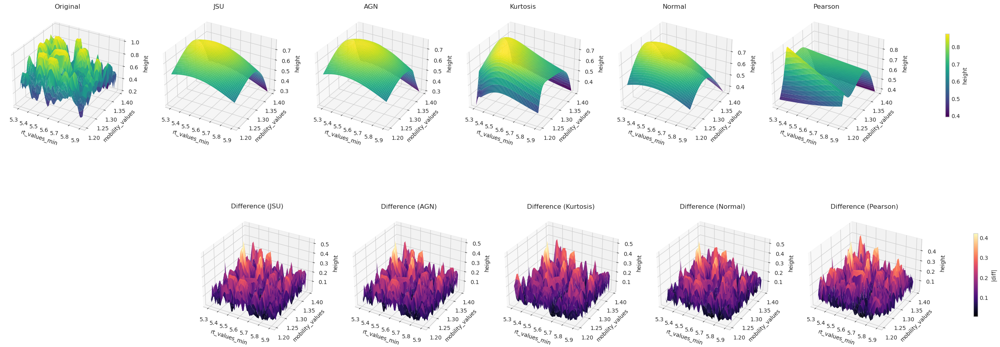

In [ ]:
from scipy.interpolate import griddata

grid_res = 50
xi = np.linspace(X_np[:, 0].min(), X_np[:, 0].max(), grid_res)
yi = np.linspace(X_np[:, 1].min(), X_np[:, 1].max(), grid_res)
grid_x, grid_y = np.meshgrid(xi, yi)

grid_z_original = griddata((X_np[:, 0], X_np[:, 1]), Y_np, (grid_x, grid_y), method='cubic')
grid_z_jsu = griddata((X_np[:, 0], X_np[:, 1]), df['height_jsu'], (grid_x, grid_y), method='cubic')
grid_z_agn = griddata((X_np[:, 0], X_np[:, 1]), df['height_agn'], (grid_x, grid_y), method='cubic')
grid_z_kurtosis = griddata((X_np[:, 0], X_np[:, 1]), df['height_kurtosis'], (grid_x, grid_y), method='cubic')
grid_z_normal = griddata((X_np[:, 0], X_np[:, 1]), df['height_normal'], (grid_x, grid_y), method='cubic')
grid_z_pearson = griddata((X_np[:, 0], X_np[:, 1]), df['height_pearson'], (grid_x, grid_y), method='cubic')

grid_z_difference_jsu = np.abs(grid_z_original - grid_z_jsu)
grid_z_difference_agn = np.abs(grid_z_original - grid_z_agn)
grid_z_difference_kurtosis = np.abs(grid_z_original - grid_z_kurtosis)
grid_z_difference_normal = np.abs(grid_z_original - grid_z_normal)
grid_z_difference_pearson = np.abs(grid_z_original - grid_z_pearson)

# Create figure with 2 rows and 4 columns
fig = plt.figure(figsize=(36, 12))
plt.style.use('seaborn-v0_8-whitegrid')

# --- Row 1: Reconstructions ---
# Plot 1: Original Data
ax1 = fig.add_subplot(2, 6, 1, projection='3d')
surf1 = ax1.plot_surface(grid_x, grid_y, grid_z_original, cmap='viridis', edgecolor='none')
ax1.set_title('Original')
ax1.set_xlabel('rt_values_min')
ax1.set_ylabel('mobility_values')
ax1.set_zlabel('height')

# Plot 2: JSU
ax2 = fig.add_subplot(2, 6, 2, projection='3d')
surf2 = ax2.plot_surface(grid_x, grid_y, grid_z_jsu, cmap='viridis', edgecolor='none')
ax2.set_title('JSU')
ax2.set_xlabel('rt_values_min')
ax2.set_ylabel('mobility_values')
ax2.set_zlabel('height')

# Plot 3: AGN
ax3 = fig.add_subplot(2, 6, 3, projection='3d')
surf3 = ax3.plot_surface(grid_x, grid_y, grid_z_agn, cmap='viridis', edgecolor='none')
ax3.set_title('AGN')
ax3.set_xlabel('rt_values_min')
ax3.set_ylabel('mobility_values')
ax3.set_zlabel('height')

# Plot 4: Kurtosis
ax4 = fig.add_subplot(2, 6, 4, projection='3d')
surf4 = ax4.plot_surface(grid_x, grid_y, grid_z_kurtosis, cmap='viridis', edgecolor='none')
ax4.set_title('Kurtosis')
ax4.set_xlabel('rt_values_min')
ax4.set_ylabel('mobility_values')
ax4.set_zlabel('height')

# Plot 5: Normal
ax5 = fig.add_subplot(2, 6, 5, projection='3d')
surf5 = ax5.plot_surface(grid_x, grid_y, grid_z_normal, cmap='viridis', edgecolor='none')
ax5.set_title('Normal')
ax5.set_xlabel('rt_values_min')
ax5.set_ylabel('mobility_values')
ax5.set_zlabel('height')

# Plot 6: Pearson
ax6 = fig.add_subplot(2, 6, 6, projection='3d')
surf6 = ax6.plot_surface(grid_x, grid_y, grid_z_pearson, cmap='viridis', edgecolor='none')
ax6.set_title('Pearson')
ax6.set_xlabel('rt_values_min')
ax6.set_ylabel('mobility_values')
ax6.set_zlabel('height')

# Placeholder for fourth method
# ax4 = fig.add_subplot(2, 4, 4, projection='3d')
# ax4.axis('off')
# ax4.set_title('Placeholder')

# --- Row 2: Differences ---
# Plot 7: Difference JSU
ax7 = fig.add_subplot(2, 6, 8, projection='3d')
surf7 = ax7.plot_surface(grid_x, grid_y, grid_z_difference_jsu, cmap='magma', edgecolor='none')
ax7.set_title('Difference (JSU)')
ax7.set_xlabel('rt_values_min')
ax7.set_ylabel('mobility_values')
ax7.set_zlabel('height')

# Plot 8: Difference AGN
ax8 = fig.add_subplot(2, 6, 9, projection='3d')
surf8 = ax8.plot_surface(grid_x, grid_y, grid_z_difference_agn, cmap='magma', edgecolor='none')
ax8.set_title('Difference (AGN)')
ax8.set_xlabel('rt_values_min')
ax8.set_ylabel('mobility_values')
ax8.set_zlabel('height')

# Plot 9: Difference Kurtosis
ax9 = fig.add_subplot(2, 6, 10, projection='3d')
surf9 = ax9.plot_surface(grid_x, grid_y, grid_z_difference_kurtosis, cmap='magma', edgecolor='none')
ax9.set_title('Difference (Kurtosis)')
ax9.set_xlabel('rt_values_min')
ax9.set_ylabel('mobility_values')
ax9.set_zlabel('height')

# Plot 10: Difference Normal
ax10 = fig.add_subplot(2, 6, 11, projection='3d')
surf10 = ax10.plot_surface(grid_x, grid_y, grid_z_difference_normal, cmap='magma', edgecolor='none')
ax10.set_title('Difference (Normal)')
ax10.set_xlabel('rt_values_min')
ax10.set_ylabel('mobility_values')
ax10.set_zlabel('height')

# Plot 11: Difference Pearson
ax11 = fig.add_subplot(2, 6, 12, projection='3d')
surf11 = ax11.plot_surface(grid_x, grid_y, grid_z_difference_pearson, cmap='magma', edgecolor='none')
ax11.set_title('Difference (Pearson)')
ax11.set_xlabel('rt_values_min')
ax11.set_ylabel('mobility_values')
ax11.set_zlabel('height')

# Placeholder difference
# ax7 = fig.add_subplot(2, 3, 6, projection='3d')
# ax7.axis('off')
# ax7.set_title('Placeholder')

# Colorbar for consistency
fig.colorbar(surf6, ax=[ax1, ax2, ax3, ax4, ax5, ax6], shrink=0.5, aspect=20, label='height')
fig.colorbar(surf11, ax=[ax7, ax8, ax9, ax10, ax11], shrink=0.5, aspect=20, label='|diff|')

# plt.tight_layout()
plt.show()


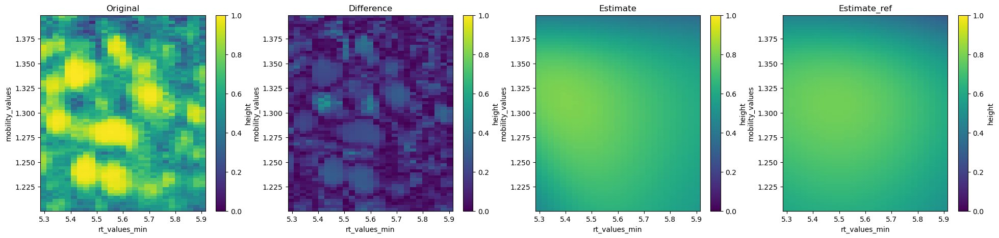

In [ ]:
import matplotlib.pyplot as plt

first_axis = 'rt_values_min'
second_axis = 'mobility_values'

if second_axis == 'mobility_values':
    df = mob_rt_examples[peak_region]['df'].copy()
    Z = mob_rt_examples[peak_region]['image'].copy()
elif second_axis == 'mz_values':
    df = mz_rt_examples[peak_region]['df'].copy()
    Z = mz_rt_examples[peak_region]['image'].copy()

# Get sampling points
exec("X_np = df[['%s', '%s']].values.astype(np.float32)" % (first_axis, second_axis))
# estimate function value
df['height'] = jsu_likelihood(tf.convert_to_tensor(params_jsu_likelihood, dtype=tf.float32), X_np).numpy() 

df['height_ref'] = jsu_likelihood_refined(tf.convert_to_tensor(params_jsu_likelihood_refined, dtype=tf.float32), X_np).numpy() 

pivot = df.pivot(
        index=second_axis,
        columns=first_axis,
        values='height'    
    )
estimate = pivot.values 


x = pivot.columns.values     # Länge = n_mz
y = pivot.index.values       # Länge = n_rt

# ===========================
pivot_ref = df.pivot(
        index=second_axis,
        columns=first_axis,
        values='height_ref'    
    )
estimate_ref = pivot_ref.values 


x_ref = pivot_ref.columns.values     # Länge = n_mz
y_ref = pivot_ref.index.values       # Länge = n_rt
# ===========================

fig, ax = plt.subplots(1, 4, figsize=(24, 5))

from matplotlib.colors import Normalize

# Normalisierung von 0 bis 1
norm = Normalize(vmin=0, vmax=1)


mesh0 = ax[0].pcolormesh(
    x, y, Z,                 
    shading='auto',          
    cmap='viridis',  
    norm=norm,
)
fig.colorbar(mesh0, ax=ax[0], label='height')
ax[0].set_ylabel(second_axis)
ax[0].set_xlabel(first_axis)
ax[0].set_title('Original')

mesh1 = ax[1].pcolormesh(
    x, y, np.abs(Z - estimate),                 
    shading='auto',          
    cmap='viridis', 
    norm=norm,           
)
fig.colorbar(mesh1, ax=ax[1], label='height')
ax[1].set_ylabel(second_axis)
ax[1].set_xlabel(first_axis)
ax[1].set_title('Difference')

mesh2 = ax[2].pcolormesh(
    x, y,  estimate,                 
    shading='auto',         
    cmap='viridis',  
    norm=norm,       
)
fig.colorbar(mesh2, ax=ax[2], label='height')
ax[2].set_ylabel(second_axis)
ax[2].set_xlabel(first_axis)
ax[2].set_title('Estimate')

# =============================
mesh3 = ax[3].pcolormesh(
    x_ref, y_ref,  estimate_ref,                 
    shading='auto',         
    cmap='viridis',  
    norm=norm,       
)
fig.colorbar(mesh2, ax=ax[3], label='height')
ax[3].set_ylabel(second_axis)
ax[3].set_xlabel(first_axis)
ax[3].set_title('Estimate_ref')

plt.show()

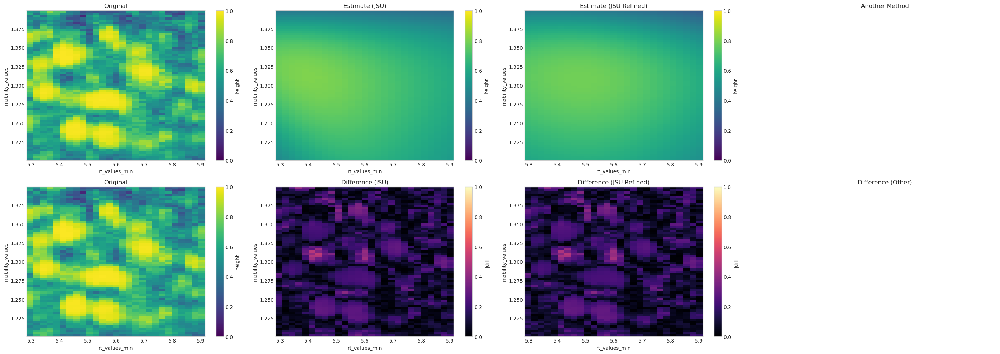

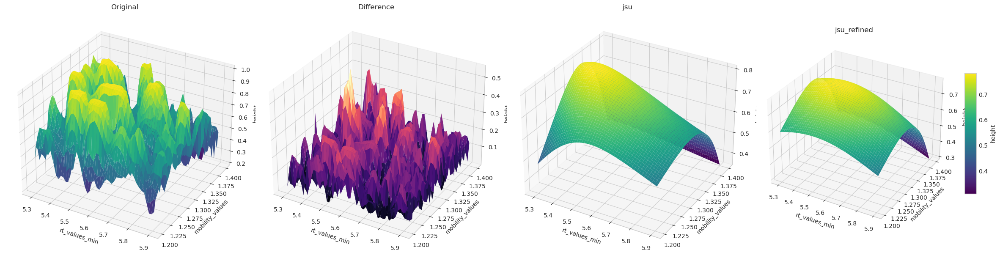

In [ ]:
from scipy.interpolate import griddata

grid_res = 50
xi = np.linspace(X_np[:, 0].min(), X_np[:, 0].max(), grid_res)
yi = np.linspace(X_np[:, 1].min(), X_np[:, 1].max(), grid_res)
grid_x, grid_y = np.meshgrid(xi, yi)

grid_z_original = griddata((X_np[:, 0], X_np[:, 1]), Y_np, (grid_x, grid_y), method='cubic')
grid_z_estimate = griddata((X_np[:, 0], X_np[:, 1]), df['height'], (grid_x, grid_y), method='cubic')
grid_z_estimate_ref = griddata((X_np[:, 0], X_np[:, 1]), df['height_ref'], (grid_x, grid_y), method='cubic')
grid_z_difference = np.abs(grid_z_original - grid_z_estimate)

# --- 5. Create the 3D Plots ---
fig = plt.figure(figsize=(24, 6))
plt.style.use('seaborn-v0_8-whitegrid')

# Plot 1: Original Data
ax1 = fig.add_subplot(141, projection='3d')
surf1 = ax1.plot_surface(grid_x, grid_y, grid_z_original, cmap='viridis', edgecolor='none')
ax1.set_xlabel('rt_values_min')
ax1.set_ylabel('mobility_values')
ax1.set_zlabel('height')
ax1.set_title('Original')

# Plot 2: Difference
ax2 = fig.add_subplot(142, projection='3d')
surf2 = ax2.plot_surface(grid_x, grid_y, grid_z_difference, cmap='magma', edgecolor='none')
ax2.set_xlabel('rt_values_min')
ax2.set_ylabel('mobility_values')
ax2.set_zlabel('height')
ax2.set_title('Difference')

# Plot 3: Estimate Data
ax3 = fig.add_subplot(143, projection='3d')
surf3 = ax3.plot_surface(grid_x, grid_y, grid_z_estimate, cmap='viridis', edgecolor='none')
ax3.set_xlabel('rt_values_min')
ax3.set_ylabel('mobility_values')
ax3.set_zlabel('height')
ax3.set_title("jsu") # Use dynamic title

# Plot 4: Estimate Data
ax4 = fig.add_subplot(144, projection='3d')
surf4 = ax4.plot_surface(grid_x, grid_y, grid_z_estimate_ref, cmap='viridis', edgecolor='none')
ax4.set_xlabel('rt_values_min')
ax4.set_ylabel('mobility_values')
ax4.set_zlabel('height')
ax4.set_title("jsu_refined") # Use dynamic title
fig.colorbar(surf4, ax=ax4, shrink=0.5, aspect=10, label='height')

plt.tight_layout()
plt.show()

/tmp/ipykernel_442620/3015907388.py:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


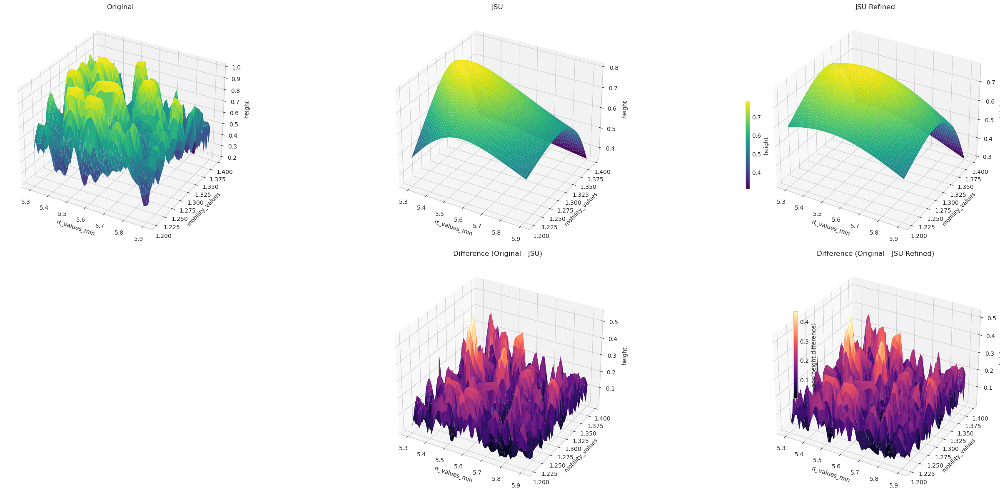

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Recalculate differences
grid_z_difference_estimate = np.abs(grid_z_original - grid_z_estimate)
grid_z_difference_ref = np.abs(grid_z_original - grid_z_estimate_ref)

# Create figure with 2 rows and 4 columns
fig = plt.figure(figsize=(28, 12))
plt.style.use('seaborn-v0_8-whitegrid')

# --- Row 1: Reconstructions ---
# Plot 1: Original Data
ax1 = fig.add_subplot(2, 3, 1, projection='3d')
surf1 = ax1.plot_surface(grid_x, grid_y, grid_z_original, cmap='viridis', edgecolor='none')
ax1.set_title('Original')
ax1.set_xlabel('rt_values_min')
ax1.set_ylabel('mobility_values')
ax1.set_zlabel('height')

# Plot 2: JSU
ax2 = fig.add_subplot(2, 3, 2, projection='3d')
surf2 = ax2.plot_surface(grid_x, grid_y, grid_z_estimate, cmap='viridis', edgecolor='none')
ax2.set_title('JSU')
ax2.set_xlabel('rt_values_min')
ax2.set_ylabel('mobility_values')
ax2.set_zlabel('height')

# Plot 3: JSU Refined
ax3 = fig.add_subplot(2, 3, 3, projection='3d')
surf3 = ax3.plot_surface(grid_x, grid_y, grid_z_estimate_ref, cmap='viridis', edgecolor='none')
ax3.set_title('JSU Refined')
ax3.set_xlabel('rt_values_min')
ax3.set_ylabel('mobility_values')
ax3.set_zlabel('height')

# Placeholder for fourth method
# ax4 = fig.add_subplot(2, 4, 4, projection='3d')
# ax4.axis('off')
# ax4.set_title('Placeholder')

# --- Row 2: Differences ---
# Plot 5: Difference JSU
ax5 = fig.add_subplot(2, 3, 5, projection='3d')
surf5 = ax5.plot_surface(grid_x, grid_y, grid_z_difference_estimate, cmap='magma', edgecolor='none')
ax5.set_title('Difference (Original - JSU)')
ax5.set_xlabel('rt_values_min')
ax5.set_ylabel('mobility_values')
ax5.set_zlabel('height')

# Plot 6: Difference JSU Refined
ax6 = fig.add_subplot(2, 3, 6, projection='3d')
surf6 = ax6.plot_surface(grid_x, grid_y, grid_z_difference_ref, cmap='magma', edgecolor='none')
ax6.set_title('Difference (Original - JSU Refined)')
ax6.set_xlabel('rt_values_min')
ax6.set_ylabel('mobility_values')
ax6.set_zlabel('height')

# Placeholder difference
# ax7 = fig.add_subplot(2, 3, 6, projection='3d')
# ax7.axis('off')
# ax7.set_title('Placeholder')

# Colorbar for consistency
fig.colorbar(surf3, ax=[ax1, ax2, ax3], shrink=0.5, aspect=20, label='height')
fig.colorbar(surf6, ax=[ax5, ax6], shrink=0.5, aspect=20, label='abs(height difference)')

plt.tight_layout()
plt.show()


In [ ]:
def Train(params, dichte, K_COMPONENTS, epochs = 100000, learning_rate=1e-2):

    def loss_fn(params):
        rho = dichte(params, X, K_COMPONENTS) #dichte(params, X)        # Vorhersagen [N]
        # mittlere quadratische Abweichung, normalisiert durch Summe aller Intensitäten
        mse = tf.reduce_sum((Y - rho)**2) / sum_intensities
        return mse

    # --- 4. Optimizer und Trainingsschleife ---
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

    # Anzahl der Iterationen / Epochen
    #epochs = 20000

    old_loss = np.inf
    opt_params = None

    for epoch in range(epochs):
        if epoch == 0:
            print(f"The number of components is {K_COMPONENTS}")
        with tf.GradientTape() as tape:
            loss = loss_fn(params)
        grads = tape.gradient(loss, [params])
        optimizer.apply_gradients(zip(grads, [params]))

        if loss.numpy() < old_loss:
            # Speichere die besten Parameter und den besten Verlust
            old_loss = loss.numpy()
            opt_params = params.numpy()

        if epoch % 200 == 0:

            # Print learned mixture weights
            learned_weights_logits = opt_params[:K_COMPONENTS]
            learned_weights = tf.nn.softmax(learned_weights_logits).numpy()

            print(f"Epoch {epoch:4d}, Loss = {loss.numpy():.6e}, Best Loss = {old_loss:.6e}, weights = {learned_weights}")


    # --- 5. Ergebnisse ausgeben ---
    print("Optimierte Parameter:", opt_params)
    # Print learned mixture weights
    learned_weights_logits = opt_params[:K_COMPONENTS]
    learned_weights = tf.nn.softmax(learned_weights_logits).numpy()
    print(f"  Learned Mixture Weights: {learned_weights}")
    opt_loss = loss_fn(tf.convert_to_tensor(opt_params, dtype=tf.float32)).numpy()
    print("Finaler Fehler:", opt_loss)
    return opt_params

In [ ]:
# --- Parameters for the Mixture Model ---
K_COMP = 3 # Let's try a 2-component mixture
total_mixture_params = K_COMP * 11

# Initial parameter guesses for a mixture are more critical
initial_mixture_params_list = []
# Weights (logits, initially equal)
initial_mixture_params_list.extend([0.0] * K_COMP)

# Component 1 guess 
# initial_mixture_params_list.extend([
#     0.0,  # log_alpha
#     tf.reduce_mean(X[:,0]).numpy(), tf.reduce_mean(X[:,1]).numpy(), # mu_x, mu_y
#     0.0, 0.0, 0.0,  # log_l11, l21, log_l22 (for identity-like initial covariance)
#     0.0, 0.0,       # gamma_1, gamma_2 (no skew)
#     tf.math.log(2.0).numpy(), tf.math.log(2.0).numpy() # log_delta_1, log_delta_2 (delta ~ 2)
# ])
# Component 2 guess
# initial_mixture_params_list.extend([
#     tf.math.log(0.6).numpy(),  # log_alpha
#     tf.reduce_mean(X[:,0]).numpy(), tf.reduce_mean(X[:,1]).numpy(),                  # mu_x, mu_y
#     tf.math.log(0.7).numpy(), 0.0, tf.math.log(0.7).numpy(),  # log_l11, l21, log_l22
#     0.1, -0.1,                 # gamma_1, gamma_2 (slight initial skew)
#     tf.math.log(1.8).numpy(), tf.math.log(1.8).numpy() # log_delta_1, log_delta_2
# ])

number_parameters_refined = 10
for _ in range(K_COMP):
    initial_mixture_params_list.extend(tf.Variable(tf.random.normal([number_parameters_refined], 
                                                                stddev=0.1, dtype=tf.float32), name="params_refined"))


mixture_params_tf_var = tf.Variable(initial_mixture_params_list, dtype=tf.float32, name="mixture_params")

# params_jsu_mixture_likelihood = Train(mixture_params_tf_var, jsu_mixture_likelihood, epochs, K_COMPONENTS)



In [ ]:
mixture_params_tf_var

<tf.Variable 'mixture_params:0' shape=(33,) dtype=float32, numpy=
array([ 0.        ,  0.        ,  0.        , -0.0280802 , -0.13186187,
       -0.09623781,  0.13823631, -0.01487095, -0.05718782, -0.03993518,
       -0.08392845, -0.17424661,  0.13920264, -0.03537044,  0.00773082,
       -0.02232549,  0.03535127, -0.00797024,  0.01511669, -0.07630323,
       -0.00044065,  0.10268169, -0.03838211, -0.05174833, -0.12704515,
        0.07425746, -0.07176431,  0.03910498, -0.02915788,  0.14665045,
        0.00535756, -0.0753242 ,  0.09119587], dtype=float32)>

In [ ]:
params_jsu_mixture_likelihood = Train(mixture_params_tf_var, jsu_mixture_likelihood,  K_COMP, epochs)

The number of components is 3
Epoch    0, Loss = 9.898105e-01, Best Loss = 9.898105e-01, weights = [0.33778325 0.3311057  0.33111107]
Epoch  200, Loss = 3.262239e-02, Best Loss = 3.262239e-02, weights = [0.65752214 0.17790908 0.16456875]
Epoch  400, Loss = 3.221117e-02, Best Loss = 3.221117e-02, weights = [0.66188556 0.17623232 0.16188206]
Epoch  600, Loss = 3.090683e-02, Best Loss = 3.090683e-02, weights = [0.66141576 0.17275618 0.1658281 ]
Epoch  800, Loss = 3.148507e-02, Best Loss = 2.914545e-02, weights = [0.6562385  0.17175235 0.17200918]
Epoch 1000, Loss = 3.103655e-02, Best Loss = 2.914545e-02, weights = [0.6562385  0.17175235 0.17200918]
Epoch 1200, Loss = 3.926035e-02, Best Loss = 2.914545e-02, weights = [0.6562385  0.17175235 0.17200918]
Epoch 1400, Loss = 2.957950e-02, Best Loss = 2.878415e-02, weights = [0.7138428  0.15354408 0.13261311]
Epoch 1600, Loss = 2.873944e-02, Best Loss = 2.873944e-02, weights = [0.7148617  0.15279661 0.13234167]
Epoch 1800, Loss = 2.869273e-02, B

Epoch 3400, Loss = 2.794893e-02, Best Loss = 2.792890e-02, weights = [0.7382029  0.13817279 0.12362425]
Epoch 3600, Loss = 2.780315e-02, Best Loss = 2.779694e-02, weights = [0.7422912  0.13575642 0.12195229]
Epoch 3800, Loss = 2.774253e-02, Best Loss = 2.766685e-02, weights = [0.74707645 0.13296138 0.11996211]
Epoch 4000, Loss = 2.754328e-02, Best Loss = 2.753528e-02, weights = [0.75153714 0.13038656 0.11807633]
Epoch 4200, Loss = 2.739029e-02, Best Loss = 2.739029e-02, weights = [0.75749505 0.12699506 0.11550988]
Epoch 4400, Loss = 2.724145e-02, Best Loss = 2.724055e-02, weights = [0.7627103  0.12411034 0.11317936]
Epoch 4600, Loss = 2.745039e-02, Best Loss = 2.708058e-02, weights = [0.75913006 0.12685482 0.11401507]
Epoch 4800, Loss = 2.681049e-02, Best Loss = 2.681049e-02, weights = [0.7300858  0.15310614 0.11680812]
Epoch 5000, Loss = 2.652910e-02, Best Loss = 2.651279e-02, weights = [0.7039487  0.1843611  0.11169022]
Epoch 5200, Loss = 2.645929e-02, Best Loss = 2.631128e-02, weigh

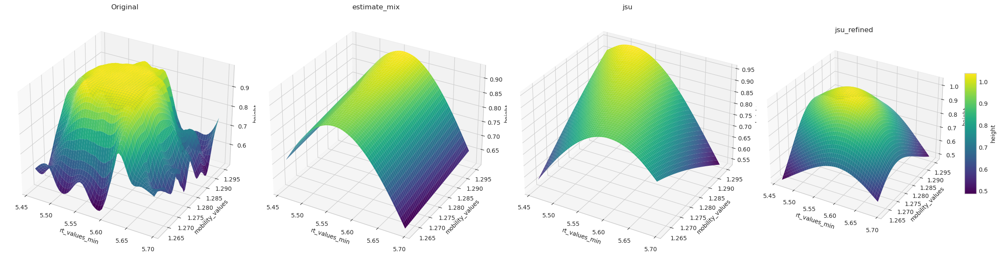

In [ ]:
from scipy.interpolate import griddata

grid_res = 50
xi = np.linspace(X_np[:, 0].min(), X_np[:, 0].max(), grid_res)
yi = np.linspace(X_np[:, 1].min(), X_np[:, 1].max(), grid_res)
grid_x, grid_y = np.meshgrid(xi, yi)

mix_result = jsu_mixture_likelihood(tf.convert_to_tensor(params_jsu_mixture_likelihood, dtype=tf.float32), X_np, K_COMP).numpy()

grid_z_original = griddata((X_np[:, 0], X_np[:, 1]), Y_np, (grid_x, grid_y), method='cubic')
grid_z_estimate = griddata((X_np[:, 0], X_np[:, 1]), df['height'], (grid_x, grid_y), method='cubic')
grid_z_estimate_ref = griddata((X_np[:, 0], X_np[:, 1]), df['height_ref'], (grid_x, grid_y), method='cubic')
# grid_z_difference = np.abs(grid_z_original - grid_z_estimate)
grid_z_estimate_mix = griddata((X_np[:, 0], X_np[:, 1]), mix_result, (grid_x, grid_y), method='cubic')

# --- 5. Create the 3D Plots ---
fig = plt.figure(figsize=(24, 6))
plt.style.use('seaborn-v0_8-whitegrid')

# Plot 1: Original Data
ax1 = fig.add_subplot(141, projection='3d')
surf1 = ax1.plot_surface(grid_x, grid_y, grid_z_original, cmap='viridis', edgecolor='none')
ax1.set_xlabel('rt_values_min')
ax1.set_ylabel('mobility_values')
ax1.set_zlabel('height')
ax1.set_title('Original')

# Plot 2: Difference
ax2 = fig.add_subplot(142, projection='3d')
# surf2 = ax2.plot_surface(grid_x, grid_y, grid_z_estimate_mix, cmap='magma', edgecolor='none')
surf2 = ax2.plot_surface(grid_x, grid_y, grid_z_estimate_mix, cmap='viridis', edgecolor='none')
ax2.set_xlabel('rt_values_min')
ax2.set_ylabel('mobility_values')
ax2.set_zlabel('height')
ax2.set_title('estimate_mix')

# Plot 3: Estimate Data
ax3 = fig.add_subplot(143, projection='3d')
surf3 = ax3.plot_surface(grid_x, grid_y, grid_z_estimate, cmap='viridis', edgecolor='none')
ax3.set_xlabel('rt_values_min')
ax3.set_ylabel('mobility_values')
ax3.set_zlabel('height')
ax3.set_title("jsu") # Use dynamic title

# Plot 4: Estimate Data
ax4 = fig.add_subplot(144, projection='3d')
surf4 = ax4.plot_surface(grid_x, grid_y, grid_z_estimate_ref, cmap='viridis', edgecolor='none')
ax4.set_xlabel('rt_values_min')
ax4.set_ylabel('mobility_values')
ax4.set_zlabel('height')
ax4.set_title("jsu_refined") # Use dynamic title
fig.colorbar(surf4, ax=ax4, shrink=0.5, aspect=10, label='height')

plt.tight_layout()
plt.show()

In [ ]:
# --- Parameters for the Mixture Model ---
K_COMPONENTS_n = 4 # Let's try a 2-component mixture

# Initial parameter guesses for a mixture are more critical
initial_mixture_params_list_n = []
# Weights (logits, initially equal)
initial_mixture_params_list_n.extend([0.0] * K_COMPONENTS_n)

# Component 1 guess 

# Component 2 guess

number_parameters_refined = 10
for _ in range(K_COMPONENTS_n):
    initial_mixture_params_list_n.extend(tf.Variable(tf.random.normal([number_parameters_refined], 
                                                                stddev=0.1, dtype=tf.float32), name="params_refined1"))


mixture_params_tf_var_n = tf.Variable(initial_mixture_params_list_n, dtype=tf.float32, name="mixture_params1")



In [ ]:
mixture_params_tf_var_n

<tf.Variable 'mixture_params1:0' shape=(44,) dtype=float32, numpy=
array([ 0.        ,  0.        ,  0.        ,  0.        , -0.16143711,
       -0.09096109, -0.11435558, -0.10666513, -0.0023336 ,  0.1157792 ,
        0.01625635,  0.13296525,  0.08501861,  0.11267936,  0.00081943,
        0.08857461,  0.06366953, -0.11272986, -0.15009299,  0.08589389,
       -0.04164872, -0.0021793 , -0.2770347 , -0.04254799,  0.01837767,
       -0.13542601, -0.10598391, -0.04479738,  0.00197905,  0.09225785,
       -0.08865907, -0.02338319,  0.00317333, -0.10719105,  0.11181543,
        0.06953997,  0.05187615,  0.12026395, -0.02885745, -0.1202439 ,
       -0.06394488, -0.02149006,  0.05228591,  0.0711666 ], dtype=float32)>

In [ ]:
params_jsu_mixture_likelihood_n = Train(mixture_params_tf_var_n, jsu_mixture_likelihood, K_COMPONENTS_n, epochs)

# params_jsu_mixture_likelihood = Train(mixture_params_tf_var, jsu_mixture_likelihood,  K_COMP, epochs)

The number of components is 4
Epoch    0, Loss = 9.922190e-01, Best Loss = 9.922190e-01, weights = [0.24630259 0.25126562 0.2512492  0.2511826 ]
Epoch  200, Loss = 3.260653e-02, Best Loss = 3.260653e-02, weights = [0.10373346 0.32788533 0.14083788 0.42754337]
Epoch  400, Loss = 3.211961e-02, Best Loss = 3.211961e-02, weights = [0.10275012 0.302492   0.13693888 0.45781898]
Epoch  600, Loss = 3.109904e-02, Best Loss = 3.105598e-02, weights = [0.10144222 0.27020586 0.12992011 0.4984318 ]
Epoch  800, Loss = 3.106220e-02, Best Loss = 2.931658e-02, weights = [0.10387514 0.25646418 0.13022175 0.50943893]
Epoch 1000, Loss = 2.881896e-02, Best Loss = 2.881896e-02, weights = [0.10385657 0.25069225 0.12374076 0.5217104 ]
Epoch 1200, Loss = 2.877969e-02, Best Loss = 2.877969e-02, weights = [0.1037486  0.2591201  0.12451883 0.51261246]
Epoch 1400, Loss = 2.873000e-02, Best Loss = 2.873000e-02, weights = [0.10342712 0.2687615  0.12540497 0.50240636]
Epoch 1600, Loss = 2.866661e-02, Best Loss = 2.866

Epoch 2600, Loss = 2.817161e-02, Best Loss = 2.816555e-02, weights = [0.09156141 0.39842084 0.13873667 0.37128106]
Epoch 2800, Loss = 2.808917e-02, Best Loss = 2.802959e-02, weights = [0.08762874 0.43650076 0.13970283 0.33616772]
Epoch 3000, Loss = 2.787481e-02, Best Loss = 2.786721e-02, weights = [0.08300937 0.47805488 0.13873503 0.3002007 ]
Epoch 3200, Loss = 2.770819e-02, Best Loss = 2.770600e-02, weights = [0.07906722 0.5059352  0.13594784 0.27904972]
Epoch 3400, Loss = 2.752685e-02, Best Loss = 2.752680e-02, weights = [0.07520384 0.52558315 0.13140969 0.26780334]
Epoch 3600, Loss = 2.736981e-02, Best Loss = 2.733106e-02, weights = [0.07045522 0.55024195 0.12385914 0.25544363]
Epoch 3800, Loss = 2.704249e-02, Best Loss = 2.704249e-02, weights = [0.06500883 0.58655643 0.11199423 0.23644054]
Epoch 4000, Loss = 2.678963e-02, Best Loss = 2.678482e-02, weights = [0.06237028 0.6076764  0.10321573 0.22673765]
Epoch 4200, Loss = 2.655446e-02, Best Loss = 2.655446e-02, weights = [0.06222958

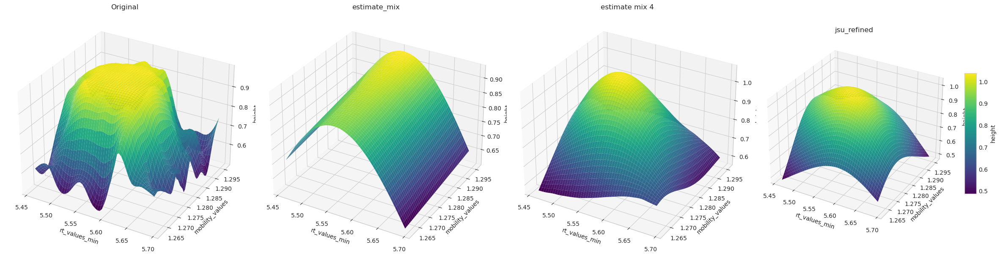

In [ ]:
from scipy.interpolate import griddata

grid_res = 50
xi = np.linspace(X_np[:, 0].min(), X_np[:, 0].max(), grid_res)
yi = np.linspace(X_np[:, 1].min(), X_np[:, 1].max(), grid_res)
grid_x, grid_y = np.meshgrid(xi, yi)

mix_result = jsu_mixture_likelihood(tf.convert_to_tensor(params_jsu_mixture_likelihood, dtype=tf.float32), X_np, K_COMP).numpy()
mix_result_new = jsu_mixture_likelihood(tf.convert_to_tensor(params_jsu_mixture_likelihood_n, dtype=tf.float32), X_np, K_COMPONENTS_n).numpy()

grid_z_original = griddata((X_np[:, 0], X_np[:, 1]), Y_np, (grid_x, grid_y), method='cubic')
grid_z_estimate_mix4 = griddata((X_np[:, 0], X_np[:, 1]), mix_result_new, (grid_x, grid_y), method='cubic')
grid_z_estimate_ref = griddata((X_np[:, 0], X_np[:, 1]), df['height_ref'], (grid_x, grid_y), method='cubic')
# grid_z_difference = np.abs(grid_z_original - grid_z_estimate)
grid_z_estimate_mix = griddata((X_np[:, 0], X_np[:, 1]), mix_result, (grid_x, grid_y), method='cubic')

# --- 5. Create the 3D Plots ---
fig = plt.figure(figsize=(24, 6))
plt.style.use('seaborn-v0_8-whitegrid')

# Plot 1: Original Data
ax1 = fig.add_subplot(141, projection='3d')
surf1 = ax1.plot_surface(grid_x, grid_y, grid_z_original, cmap='viridis', edgecolor='none')
ax1.set_xlabel('rt_values_min')
ax1.set_ylabel('mobility_values')
ax1.set_zlabel('height')
ax1.set_title('Original')

# Plot 2: Difference
ax2 = fig.add_subplot(142, projection='3d')
# surf2 = ax2.plot_surface(grid_x, grid_y, grid_z_estimate_mix, cmap='magma', edgecolor='none')
surf2 = ax2.plot_surface(grid_x, grid_y, grid_z_estimate_mix, cmap='viridis', edgecolor='none')
ax2.set_xlabel('rt_values_min')
ax2.set_ylabel('mobility_values')
ax2.set_zlabel('height')
ax2.set_title('estimate_mix')

# Plot 3: Estimate Data
ax3 = fig.add_subplot(143, projection='3d')
surf3 = ax3.plot_surface(grid_x, grid_y, grid_z_estimate_mix4, cmap='viridis', edgecolor='none')
ax3.set_xlabel('rt_values_min')
ax3.set_ylabel('mobility_values')
ax3.set_zlabel('height')
ax3.set_title("estimate mix 4") # Use dynamic title

# Plot 4: Estimate Data
ax4 = fig.add_subplot(144, projection='3d')
surf4 = ax4.plot_surface(grid_x, grid_y, grid_z_estimate_ref, cmap='viridis', edgecolor='none')
ax4.set_xlabel('rt_values_min')
ax4.set_ylabel('mobility_values')
ax4.set_zlabel('height')
ax4.set_title("jsu_refined") # Use dynamic title
fig.colorbar(surf4, ax=ax4, shrink=0.5, aspect=10, label='height')

plt.tight_layout()
plt.show()

Epoch    0, Loss = 4.962176e-01, Best Loss = 4.962176e-01
Epoch  200, Loss = 2.426919e-02, Best Loss = 2.426919e-02
Epoch  400, Loss = 2.342437e-02, Best Loss = 2.342437e-02
Epoch  600, Loss = 2.305424e-02, Best Loss = 2.305424e-02
Epoch  800, Loss = 2.288498e-02, Best Loss = 2.288498e-02
Epoch 1000, Loss = 2.275693e-02, Best Loss = 2.275693e-02
Epoch 1200, Loss = 2.264572e-02, Best Loss = 2.264572e-02
Epoch 1400, Loss = 2.252555e-02, Best Loss = 2.252555e-02
Epoch 1600, Loss = 2.233401e-02, Best Loss = 2.233401e-02
Epoch 1800, Loss = 2.160089e-02, Best Loss = 2.140450e-02
Epoch 2000, Loss = 1.724253e-02, Best Loss = 1.217662e-02
Epoch 2200, Loss = 8.434172e-03, Best Loss = 8.434172e-03
Epoch 2400, Loss = 6.928306e-03, Best Loss = 6.928306e-03
Epoch 2600, Loss = 6.902162e-03, Best Loss = 6.889757e-03
Epoch 2800, Loss = 6.898063e-03, Best Loss = 6.884513e-03
Epoch 3000, Loss = 6.982290e-03, Best Loss = 6.880208e-03
Epoch 3200, Loss = 6.911106e-03, Best Loss = 6.876133e-03
Epoch 3400, Lo

Epoch 7800, Loss = 6.977568e-03, Best Loss = 6.870718e-03
Epoch 8000, Loss = 6.876046e-03, Best Loss = 6.870718e-03
Epoch 8200, Loss = 6.928482e-03, Best Loss = 6.870718e-03
Epoch 8400, Loss = 6.878053e-03, Best Loss = 6.870718e-03
Epoch 8600, Loss = 6.871940e-03, Best Loss = 6.870718e-03
Epoch 8800, Loss = 6.875620e-03, Best Loss = 6.870718e-03
Epoch 9000, Loss = 6.986956e-03, Best Loss = 6.870718e-03
Epoch 9200, Loss = 6.871298e-03, Best Loss = 6.870713e-03
Epoch 9400, Loss = 6.886177e-03, Best Loss = 6.870713e-03
Epoch 9600, Loss = 6.871384e-03, Best Loss = 6.870713e-03
Epoch 9800, Loss = 6.872972e-03, Best Loss = 6.870704e-03
Epoch 10000, Loss = 6.880302e-03, Best Loss = 6.870704e-03
Epoch 10200, Loss = 6.871661e-03, Best Loss = 6.870704e-03
Epoch 10400, Loss = 6.887627e-03, Best Loss = 6.870702e-03
Epoch 10600, Loss = 6.872533e-03, Best Loss = 6.870702e-03
Epoch 10800, Loss = 6.972262e-03, Best Loss = 6.870702e-03
Epoch 11000, Loss = 6.870831e-03, Best Loss = 6.870702e-03
Epoch 11

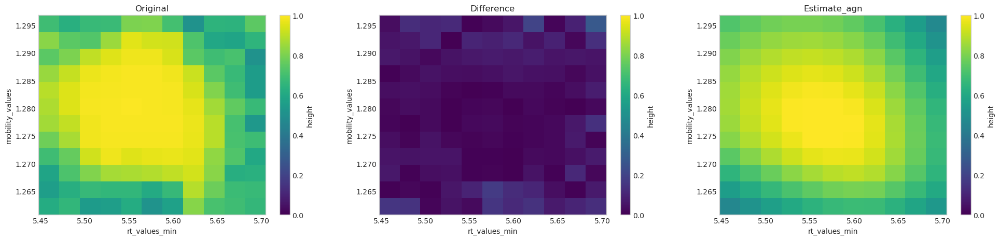

In [ ]:
import matplotlib.pyplot as plt

first_axis = 'rt_values_min'
second_axis = 'mobility_values'

if second_axis == 'mobility_values':
    df = mob_rt_examples[peak_region]['df'].copy()
    Z = mob_rt_examples[peak_region]['image'].copy()
elif second_axis == 'mz_values':
    df = mz_rt_examples[peak_region]['df'].copy()
    Z = mz_rt_examples[peak_region]['image'].copy()

# Get sampling points
exec("X_np = df[['%s', '%s']].values.astype(np.float32)" % (first_axis, second_axis))
# estimate function value
# df['height'] = agn_2d_peak(tf.convert_to_tensor(params_jsu_likelihood, dtype=tf.float32), X_np).numpy() 

df['height_agn'] = agn_2d_peak(tf.convert_to_tensor(params_agn_tf_var, dtype=tf.float32), X_np).numpy() 

# pivot = df.pivot(
#         index=second_axis,
#         columns=first_axis,
#         values='height'    
#     )
# estimate = pivot.values 


# x = pivot.columns.values     # Länge = n_mz
# y = pivot.index.values       # Länge = n_rt

# ===========================
pivot_agn = df.pivot(
        index=second_axis,
        columns=first_axis,
        values='height_agn'    
    )
estimate_agn = pivot_agn.values 


x_agn = pivot_agn.columns.values     # Länge = n_mz
y_agn = pivot_agn.index.values       # Länge = n_rt
# ===========================

fig, ax = plt.subplots(1, 3, figsize=(24, 5))

from matplotlib.colors import Normalize

# Normalisierung von 0 bis 1
norm = Normalize(vmin=0, vmax=1)


mesh0 = ax[0].pcolormesh(
    x_agn, y_agn, Z,                 
    shading='auto',          
    cmap='viridis',  
    norm=norm,
)
fig.colorbar(mesh0, ax=ax[0], label='height')
ax[0].set_ylabel(second_axis)
ax[0].set_xlabel(first_axis)
ax[0].set_title('Original')

mesh1 = ax[1].pcolormesh(
    x_agn, y_agn, np.abs(Z - estimate_agn),                 
    shading='auto',          
    cmap='viridis', 
    norm=norm,           
)
fig.colorbar(mesh1, ax=ax[1], label='height')
ax[1].set_ylabel(second_axis)
ax[1].set_xlabel(first_axis)
ax[1].set_title('Difference')

mesh2 = ax[2].pcolormesh(
    x_agn, y_agn,  estimate_agn,                 
    shading='auto',         
    cmap='viridis',  
    norm=norm,       
)
fig.colorbar(mesh2, ax=ax[2], label='height')
ax[2].set_ylabel(second_axis)
ax[2].set_xlabel(first_axis)
ax[2].set_title('Estimate_agn')

# # =============================
# mesh3 = ax[3].pcolormesh(
#     x_ref, y_ref,  estimate_ref,                 
#     shading='auto',         
#     cmap='viridis',  
#     norm=norm,       
# )
# fig.colorbar(mesh2, ax=ax[3], label='height')
# ax[3].set_ylabel(second_axis)
# ax[3].set_xlabel(first_axis)
# ax[3].set_title('Estimate_ref')

plt.show()

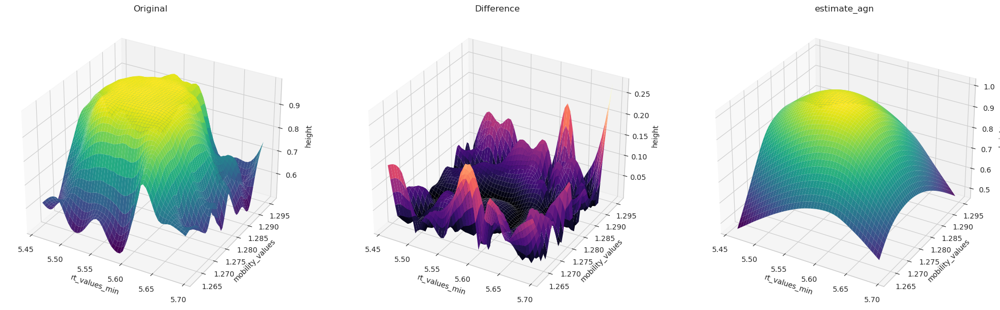

In [ ]:
from scipy.interpolate import griddata

grid_res = 50
xi = np.linspace(X_np[:, 0].min(), X_np[:, 0].max(), grid_res)
yi = np.linspace(X_np[:, 1].min(), X_np[:, 1].max(), grid_res)
grid_x, grid_y = np.meshgrid(xi, yi)

# mix_result = jsu_mixture_likelihood(tf.convert_to_tensor(params_jsu_mixture_likelihood, dtype=tf.float32), X_np, K_COMP).numpy()
# mix_result_new = jsu_mixture_likelihood(tf.convert_to_tensor(params_jsu_mixture_likelihood_n, dtype=tf.float32), X_np, K_COMPONENTS_n).numpy()

grid_z_original = griddata((X_np[:, 0], X_np[:, 1]), Y_np, (grid_x, grid_y), method='cubic')
# grid_z_estimate_mix4 = griddata((X_np[:, 0], X_np[:, 1]), mix_result_new, (grid_x, grid_y), method='cubic')
grid_z_estimate_agn = griddata((X_np[:, 0], X_np[:, 1]), df['height_agn'], (grid_x, grid_y), method='cubic')
grid_z_difference = np.abs(grid_z_original - grid_z_estimate_agn)
# grid_z_estimate_mix = griddata((X_np[:, 0], X_np[:, 1]), mix_result, (grid_x, grid_y), method='cubic')

# --- 5. Create the 3D Plots ---
fig = plt.figure(figsize=(20, 6))
plt.style.use('seaborn-v0_8-whitegrid')

# Plot 1: Original Data
ax1 = fig.add_subplot(131, projection='3d')
surf1 = ax1.plot_surface(grid_x, grid_y, grid_z_original, cmap='viridis', edgecolor='none')
ax1.set_xlabel('rt_values_min')
ax1.set_ylabel('mobility_values')
ax1.set_zlabel('height')
ax1.set_title('Original')

# Plot 2: Difference
ax2 = fig.add_subplot(133, projection='3d')
# surf2 = ax2.plot_surface(grid_x, grid_y, grid_z_estimate_mix, cmap='magma', edgecolor='none')
surf2 = ax2.plot_surface(grid_x, grid_y, grid_z_estimate_agn, cmap='viridis', edgecolor='none')
ax2.set_xlabel('rt_values_min')
ax2.set_ylabel('mobility_values')
ax2.set_zlabel('height')
ax2.set_title('estimate_agn')

# Plot 3: Estimate Data
ax3 = fig.add_subplot(132, projection='3d')
surf3 = ax3.plot_surface(grid_x, grid_y, grid_z_difference, cmap='magma', edgecolor='none')
ax3.set_xlabel('rt_values_min')
ax3.set_ylabel('mobility_values')
ax3.set_zlabel('height')
ax3.set_title("Difference") # Use dynamic title

# # Plot 4: Estimate Data
# ax4 = fig.add_subplot(144, projection='3d')
# surf4 = ax4.plot_surface(grid_x, grid_y, grid_z_estimate_ref, cmap='viridis', edgecolor='none')
# ax4.set_xlabel('rt_values_min')
# ax4.set_ylabel('mobility_values')
# ax4.set_zlabel('height')
# ax4.set_title("jsu_refined") # Use dynamic title
# fig.colorbar(surf4, ax=ax4, shrink=0.5, aspect=10, label='height')

plt.tight_layout()
plt.show()

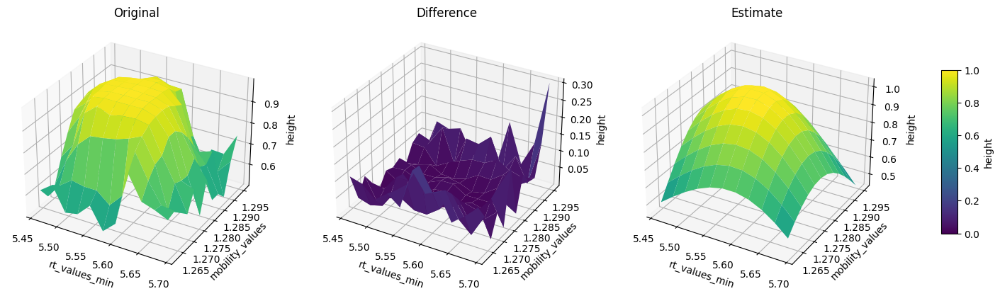

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from mpl_toolkits.mplot3d import Axes3D  # muss importiert sein, auch wenn nicht direkt verwendet

# 1) Gitter erstellen
X, Y = np.meshgrid(x, y)

# 2) gemeinsame Farbskalierung von 0…1
norm = Normalize(vmin=0, vmax=1)

# 3) Figure und 3D-Achse
fig, axes = plt.subplots(
    1, 4, 
    subplot_kw={'projection': '3d'}, 
    figsize=(24, 6)
)

for ax, Zdata, title in zip(
    axes,
    [Z, np.abs(Z - estimate), estimate],
    ['Original', 'Difference', 'Estimate']
):
    surf = ax.plot_surface(X, Y, Zdata, cmap='viridis', norm=norm)
    ax.set_xlabel(first_axis)
    ax.set_ylabel(second_axis)
    ax.set_zlabel('height')
    ax.set_title(title)

# gemeinsame Colorbar
fig.colorbar(surf, ax=axes.tolist(), shrink=0.5, aspect=10, label='height')
plt.show()



### weitere Verteilungen

In [ ]:
import numpy as np
import tensorflow as tf

# --- 1. Datenvorbereitung ---
# Hol dir deine Peak-Region und baue daraus NumPy-Arrays
peak_region = 9

df = mob_rt_examples[peak_region]['df']

# X: (N_samples, 3), Y: (N_samples,)
X_np = df[['rt_values_min', 'mobility_values']].values.astype(np.float32)
Y_np = df['height'].values.astype(np.float32)
sum_intensities = np.sum(Y_np**2)

# In TensorFlow konvertieren
X = tf.constant(X_np)                  # shape [N, 2] <- (rt_values_min, mobility_values) for all N samples
Y = tf.constant(Y_np)                  # shape [N] 

In [62]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from mpl_toolkits.mplot3d import Axes3D  # muss importiert sein, auch wenn nicht direkt verwendet

def plot(params, dichte):
    first_axis = 'rt_values_min'
    second_axis = 'mobility_values'

    if second_axis == 'mobility_values':
        df = mob_rt_examples[peak_region]['df'].copy()
        Z = mob_rt_examples[peak_region]['image'].copy()
    elif second_axis == 'mz_values':
        df = mz_rt_examples[peak_region]['df'].copy()
        Z = mz_rt_examples[peak_region]['image'].copy()

    # Get sampling points
    exec("X_np = df[['%s', '%s']].values.astype(np.float32)" % (first_axis, second_axis))
    # estimate function value
    df['height'] = dichte(tf.convert_to_tensor(params, dtype=tf.float32), X_np).numpy() 

    pivot = df.pivot(
            index=second_axis,
            columns=first_axis,
            values='height'    
        )
    estimate = pivot.values 


    x = pivot.columns.values     # Länge = n_mz
    y = pivot.index.values       # Länge = n_rt

    # 1) Gitter erstellen
    X_mesh, Y_mesh = np.meshgrid(x, y)

    # 2) gemeinsame Farbskalierung von 0…1
    norm = Normalize(vmin=0, vmax=1)

    # 3) Figure und 3D-Achse
    fig, axes = plt.subplots(
        1, 3, 
        subplot_kw={'projection': '3d'}, 
        figsize=(20, 6)
    )

    for ax, Zdata, title in zip(
        axes,
        [Z, np.abs(Z - estimate), estimate],
        ['Original', 'Difference', 'Estimate']
    ):
        surf = ax.plot_surface(X_mesh, Y_mesh, Zdata, cmap='viridis', norm=norm)
        ax.set_xlabel(first_axis)
        ax.set_ylabel(second_axis)
        ax.set_zlabel('height')
        ax.set_title(title)

    # gemeinsame Colorbar
    fig.colorbar(surf, ax=axes.tolist(), shrink=0.5, aspect=10, label='height')
    plt.show()


#### Tukey-g-and-h–Verteilung

Gefunden: https://arxiv.org/pdf/2411.07957

- Formel (multivariat):

$$
p(x)=\alpha \prod_{i=1}^n|\underbrace{\frac{d}{d z}\left[\frac{e^{g_i z}-1}{g_i} e^{\frac{h_i z^2}{2}}\right]}_{d Q_i / d z}|_{z=(A(x-\zeta))_i} .
$$


In [66]:
# --- Parameterzahl und Variablen ---
n = 2
# params = [alpha, zeta(n), g(n), h(n>=0), A(n×n)]
num_params = 1 + n + n + n + n*n
params = tf.Variable(tf.random.normal([num_params], stddev=0.1), name="gh_params")

def tukey_gh_mvd(params, X):
    alpha = params[0]
    zeta  = params[1:1+n]
    g     = params[1+n:1+2*n]
    h     = tf.nn.relu(params[1+2*n:1+3*n])       # h ≥ 0
    A_flat= params[1+3*n:]
    A     = tf.reshape(A_flat, (n,n))

    #print("X.shape: ", X.shape)
    #print("zeta.shape: ", zeta.shape)

    # Whitening
    centered = X - zeta                           # [N,n]
    Z        = tf.matmul(centered, A, transpose_b=True)  # [N,n]

    # Quantil-Funktion und ihr Ableiter:
    # Q(z) = (e^{g z} - 1)/g * e^{h z^2/2}
    exp_gz = tf.exp(g * Z)
    W      = (exp_gz - 1) / g                     # [N,n]
    e_h    = tf.exp(0.5 * h * Z**2)               # [N,n]

    # dQ/dz = e^{h z^2/2} * ( e^{g z} + W * h * z )
    dQdz   = e_h * (exp_gz + W * h * Z)           # [N,n]

    rho = alpha * tf.reduce_prod(tf.abs(dQdz), axis=1)  # [N]
    return rho


In [69]:
params_tukey_gh = train(params, tukey_gh_mvd)

Epoch    0, Loss = 7.815629e-01, Best Loss = 7.815629e-01
Epoch  200, Loss = 3.601559e-02, Best Loss = 3.601559e-02
Epoch  400, Loss = 3.574219e-02, Best Loss = 3.574219e-02
Epoch  600, Loss = 3.544035e-02, Best Loss = 3.544035e-02
Epoch  800, Loss = 3.514355e-02, Best Loss = 3.514355e-02
Epoch 1000, Loss = 3.486661e-02, Best Loss = 3.486661e-02
Epoch 1200, Loss = 3.461292e-02, Best Loss = 3.461292e-02
Epoch 1400, Loss = 3.437797e-02, Best Loss = 3.437797e-02
Epoch 1600, Loss = 3.415044e-02, Best Loss = 3.415044e-02
Epoch 1800, Loss = 3.391234e-02, Best Loss = 3.391234e-02
Epoch 2000, Loss = 3.363934e-02, Best Loss = 3.363934e-02
Epoch 2200, Loss = 3.330407e-02, Best Loss = 3.330407e-02
Epoch 2400, Loss = 3.288602e-02, Best Loss = 3.288602e-02
Epoch 2600, Loss = 3.239693e-02, Best Loss = 3.239693e-02
Epoch 2800, Loss = 3.191759e-02, Best Loss = 3.191759e-02
Epoch 3000, Loss = 3.158529e-02, Best Loss = 3.158529e-02
Epoch 3200, Loss = 3.143939e-02, Best Loss = 3.143350e-02
Epoch 3400, Lo

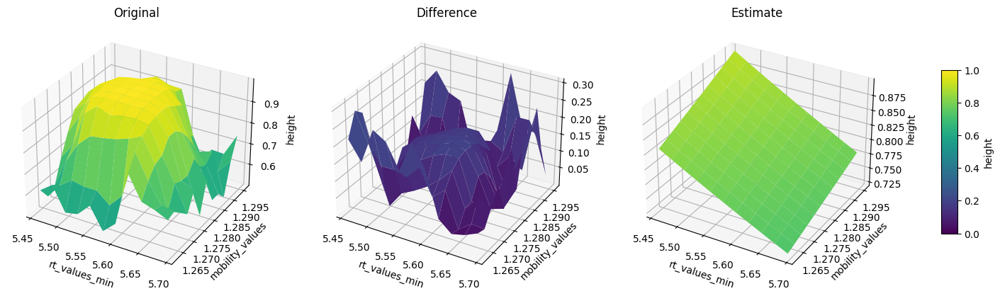

In [70]:
plot(params_tukey_gh, tukey_gh_mvd)

#### Normalverteilung

\begin{equation}
p(x)=\alpha \exp \left(-\frac{1}{2} y^{\top} y\right), \quad y=A(x-\zeta) .
\end{equation}

In [71]:
# --- Parameterzahl und Variablen ---
n = 2
# params = [alpha, zeta(n), A(n×n)]
num_params = 1 + n + n*n
params = tf.Variable(tf.random.normal([num_params], stddev=0.1), name="normal_params")

def normal_mvd(params, X):
    alpha = params[0]
    zeta  = params[1:1+n]
    A_flat= params[1+n:]
    A     = tf.reshape(A_flat, (n,n))

    centered = X - zeta
    Y        = tf.matmul(centered, A, transpose_b=True)  # [N,n]

    # univariate Normal (bis auf Konstanten): exp(-½ z^2)
    rho_comp = tf.exp(-0.5 * Y**2)                        # [N,n]

    rho = alpha * tf.reduce_prod(rho_comp, axis=1)       # [N]
    return rho


In [72]:
params_normal = train(params, normal_mvd)

Epoch    0, Loss = 9.201890e-01, Best Loss = 9.201890e-01
Epoch  200, Loss = 3.386807e-02, Best Loss = 3.386807e-02
Epoch  400, Loss = 3.369213e-02, Best Loss = 3.369213e-02
Epoch  600, Loss = 3.314237e-02, Best Loss = 3.314237e-02
Epoch  800, Loss = 3.199117e-02, Best Loss = 3.195385e-02
Epoch 1000, Loss = 3.124785e-02, Best Loss = 3.124785e-02
Epoch 1200, Loss = 3.100331e-02, Best Loss = 3.100331e-02
Epoch 1400, Loss = 3.092428e-02, Best Loss = 3.092428e-02
Epoch 1600, Loss = 3.087766e-02, Best Loss = 3.087766e-02
Epoch 1800, Loss = 3.081694e-02, Best Loss = 3.081694e-02
Epoch 2000, Loss = 3.072142e-02, Best Loss = 3.072142e-02
Epoch 2200, Loss = 3.057720e-02, Best Loss = 3.057720e-02
Epoch 2400, Loss = 3.035208e-02, Best Loss = 3.035208e-02
Epoch 2600, Loss = 2.998840e-02, Best Loss = 2.998840e-02
Epoch 2800, Loss = 2.940399e-02, Best Loss = 2.940399e-02
Epoch 3000, Loss = 2.851996e-02, Best Loss = 2.851996e-02
Epoch 3200, Loss = 2.737016e-02, Best Loss = 2.737016e-02
Epoch 3400, Lo

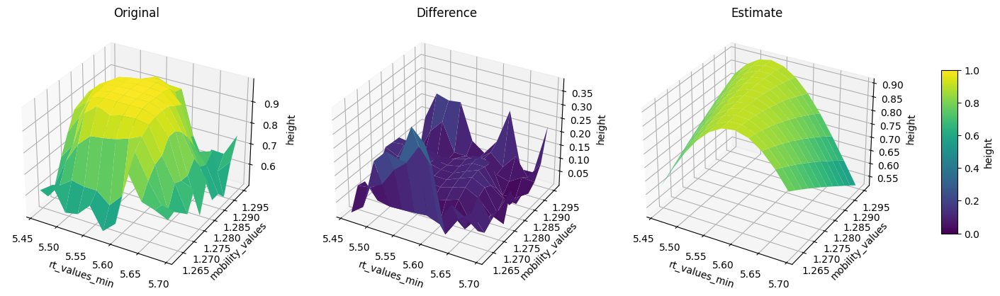

In [73]:
plot(params_normal, normal_mvd)

#### Exponentially Modified Gaussian

Univariat ist

$$
f(x ; \mu, \sigma, \lambda)=\frac{\lambda}{2} \exp \left[\frac{\lambda}{2}\left(2 \mu+\lambda \sigma^2-2 x\right)\right] \operatorname{erfc}\left(\frac{\mu+\lambda \sigma^2-x}{\sqrt{2} \sigma}\right) .
$$


Setzen wir $\mu=0, \sigma=1$ (das Whitening übernimmt A), so gilt (bis auf konstanten Faktor) $\rho(y ; \lambda) \propto \exp (-\lambda y) \quad \operatorname{erfc}((\lambda-y) / \sqrt{2})$.

Formel multivariat:
\begin{equation}
p(x)=\alpha \prod_{i=1}^n\left[\exp \left(-\lambda_i y_i\right) \quad \operatorname{erfc}\left(\frac{\lambda_i-y_i}{\sqrt{2}}\right)\right], \quad y=A(x-\zeta) .
\end{equation}

In [74]:
# --- Parameterzahl und Variablen ---
n = 2
# params = [alpha, zeta(n), lambda(n>0), A(n×n)]
num_params = 1 + n + n + n*n
params = tf.Variable(tf.random.normal([num_params], stddev=0.1), name="emg_params")

def emg_mvd(params, X):
    alpha = params[0]
    zeta  = params[1:1+n]
    lam   = tf.nn.softplus(params[1+n:1+2*n])  # λ>0
    A_flat= params[1+2*n:]
    A     = tf.reshape(A_flat, (n,n))

    centered = X - zeta
    Y        = tf.matmul(centered, A, transpose_b=True)  # [N,n]

    # univ. EMG-Dichte (bis auf Konstanten):
    erfc_arg = (lam - Y) / tf.sqrt(2.0)
    rho_comp = tf.exp(-lam * Y) * tf.math.erfc(erfc_arg)  # [N,n]

    rho = alpha * tf.reduce_prod(rho_comp, axis=1)       # [N]
    return rho


In [75]:
params_emg = train(params, emg_mvd)

Epoch    0, Loss = 1.009262e+00, Best Loss = 1.009262e+00
Epoch  200, Loss = 3.345186e-02, Best Loss = 3.345186e-02
Epoch  400, Loss = 3.318964e-02, Best Loss = 3.318964e-02
Epoch  600, Loss = 3.288525e-02, Best Loss = 3.288525e-02
Epoch  800, Loss = 3.253917e-02, Best Loss = 3.253917e-02
Epoch 1000, Loss = 3.218568e-02, Best Loss = 3.218568e-02
Epoch 1200, Loss = 3.188283e-02, Best Loss = 3.188283e-02
Epoch 1400, Loss = 3.167010e-02, Best Loss = 3.167010e-02
Epoch 1600, Loss = 3.153997e-02, Best Loss = 3.153997e-02
Epoch 1800, Loss = 3.145340e-02, Best Loss = 3.145340e-02
Epoch 2000, Loss = 3.136250e-02, Best Loss = 3.136250e-02
Epoch 2200, Loss = 3.123164e-02, Best Loss = 3.123164e-02
Epoch 2400, Loss = 3.101974e-02, Best Loss = 3.101974e-02
Epoch 2600, Loss = 3.063516e-02, Best Loss = 3.063516e-02
Epoch 2800, Loss = 2.989687e-02, Best Loss = 2.989687e-02
Epoch 3000, Loss = 2.861699e-02, Best Loss = 2.861699e-02
Epoch 3200, Loss = 2.690247e-02, Best Loss = 2.690247e-02
Epoch 3400, Lo

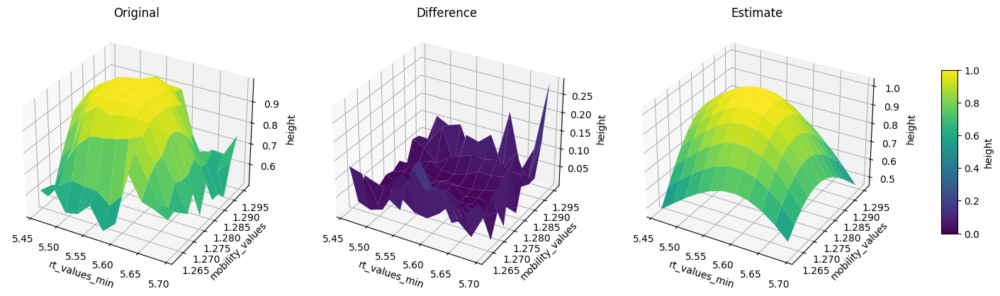

In [76]:
plot(params_emg, emg_mvd)

#### Symmetrische α-stable

Our $\beta$ is $\alpha$

\begin{equation}
p(x)=\alpha \prod_{i=1}^n \exp \left(-\left|y_i\right|^{\beta_i}\right), \quad y=A(x-\zeta) .
\end{equation}

In [77]:
# --- Parameterzahl und Variables ---
n = 2
# alpha, zeta (n), beta (n), A (n×n)
num_params = 1 + n + n + n*n
params = tf.Variable(tf.random.normal([num_params], stddev=0.1), name="ged_params")

def ged_mvd(params, X):
    # n aus Länge params errechnen oder explizit setzen
    alpha = params[0]
    zeta   = params[1:1+n]                   # Lage
    beta   = tf.abs(params[1+n:1+2*n])      # Form > 0
    A_flat = params[1+2*n:]
    A      = tf.reshape(A_flat, (n,n))      # Precision-Faktor

    # transformieren
    centered   = X - zeta                    # [N,n]
    Y          = tf.matmul(centered, A, transpose_b=True)  # [N,n]

    # component-wise GED-Dichte (bis auf Konstanten)
    # ρ_i ∝ exp(-|y|^β)
    exponent        = - tf.abs(Y)**beta      # [N,n]
    rho_components  = tf.exp(exponent)       # [N,n]

    rho = alpha * tf.reduce_prod(rho_components, axis=1)  # [N]
    return rho


In [78]:
params_ged = train(params, ged_mvd)

Epoch    0, Loss = 1.034397e+00, Best Loss = 1.034397e+00
Epoch  200, Loss = 3.347003e-02, Best Loss = 3.347003e-02
Epoch  400, Loss = 3.344303e-02, Best Loss = 3.344303e-02
Epoch  600, Loss = 3.340720e-02, Best Loss = 3.340720e-02
Epoch  800, Loss = 3.336307e-02, Best Loss = 3.336307e-02
Epoch 1000, Loss = 3.330996e-02, Best Loss = 3.330996e-02
Epoch 1200, Loss = 3.324495e-02, Best Loss = 3.324495e-02
Epoch 1400, Loss = 3.315802e-02, Best Loss = 3.315802e-02
Epoch 1600, Loss = 3.297432e-02, Best Loss = 3.297432e-02
Epoch 1800, Loss = 3.287261e-02, Best Loss = 3.207098e-02
Epoch 2000, Loss = 3.419000e-02, Best Loss = 3.199195e-02
Epoch 2200, Loss = 3.377650e-02, Best Loss = 3.199195e-02
Epoch 2400, Loss = 3.364524e-02, Best Loss = 3.199195e-02
Epoch 2600, Loss = 3.423199e-02, Best Loss = 3.199195e-02
Epoch 2800, Loss = 3.399002e-02, Best Loss = 3.199195e-02
Epoch 3000, Loss = 3.378984e-02, Best Loss = 3.199195e-02
Epoch 3200, Loss = 3.360631e-02, Best Loss = 3.199195e-02
Epoch 3400, Lo

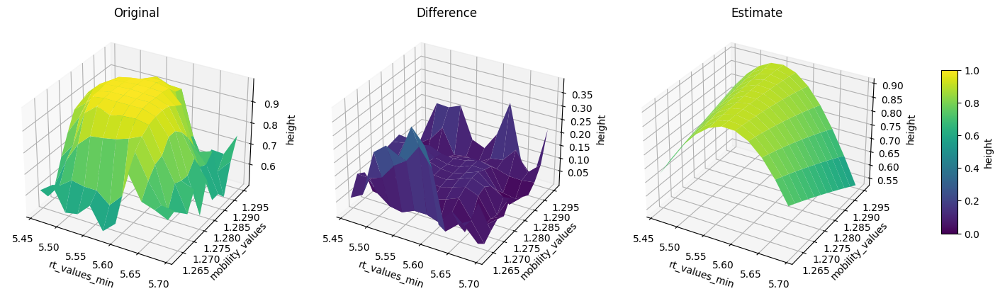

In [79]:
plot(params_ged, ged_mvd)

#### Student-t

\begin{equation}
p(x)=\alpha \prod_{i=1}^n\left(1+\frac{y_i^2}{\nu}\right)^{-\frac{\nu+1}{2}}, \quad y=A(x-\zeta) .
\end{equation}

In [ ]:
# alpha, zeta(n), ν (Skalar), A(n×n)
num_params = 1 + n + 1 + n*n
params = tf.Variable(tf.random.normal([num_params], stddev=0.1), name="t_params")

def student_t_mvd(params, X):
    alpha = params[0]
    zeta  = params[1:1+n]
    nu    = tf.nn.softplus(params[1+n]) + 1e-3   # ν>0
    A_flat = params[2+n:]
    A     = tf.reshape(A_flat, (n,n))

    centered = X - zeta
    Y        = tf.matmul(centered, A, transpose_b=True)

    # univariate t-Dichte (bis auf Konstanten):
    # ρ_i ∝ (1 + y_i^2/nu)^(-(nu+1)/2)
    rho_comp = (1 + Y**2/nu)**(-0.5*(nu+1))
    rho = alpha * tf.reduce_prod(rho_comp, axis=1)
    return rho

In [ ]:
params_student = train(params, student_t_mvd)

Epoch    0, Loss = 1.061284e+00, Best Loss = 1.061284e+00
Epoch  200, Loss = 3.384343e-02, Best Loss = 3.384343e-02
Epoch  400, Loss = 3.374381e-02, Best Loss = 3.374381e-02
Epoch  600, Loss = 3.362466e-02, Best Loss = 3.362466e-02
Epoch  800, Loss = 3.347513e-02, Best Loss = 3.347513e-02
Epoch 1000, Loss = 3.328479e-02, Best Loss = 3.328479e-02
Epoch 1200, Loss = 3.304223e-02, Best Loss = 3.304223e-02
Epoch 1400, Loss = 3.273732e-02, Best Loss = 3.273732e-02
Epoch 1600, Loss = 3.237124e-02, Best Loss = 3.237124e-02
Epoch 1800, Loss = 3.197214e-02, Best Loss = 3.197214e-02
Epoch 2000, Loss = 3.160305e-02, Best Loss = 3.160305e-02
Epoch 2200, Loss = 3.134542e-02, Best Loss = 3.134542e-02
Epoch 2400, Loss = 3.120326e-02, Best Loss = 3.120326e-02
Epoch 2600, Loss = 3.099673e-02, Best Loss = 3.099673e-02
Epoch 2800, Loss = 3.040510e-02, Best Loss = 3.034980e-02
Epoch 3000, Loss = 2.914526e-02, Best Loss = 2.914526e-02
Epoch 3200, Loss = 2.852766e-02, Best Loss = 2.690217e-02
Epoch 3400, Lo

In [81]:
plot(params_student, student_t_mvd)

NameError: name 'params_student' is not defined

#### Multivariate Skew-Normal (Azzalini)

\begin{equation}
p(x)=\alpha \prod_{i=1}^n 2 \varphi\left(y_i\right) \Phi\left(\lambda_i y_i\right), \quad y=A(x-\zeta) .
\end{equation}

$\phi$ is die Dichte, $\Phi$ die Verteilungsfunktion der Normalverteilung



In [82]:
# alpha, zeta(n), shape λ(n), A(n×n)
num_params = 1 + n + n + n*n
params = tf.Variable(tf.random.normal([num_params], stddev=0.1), name="sn_params")

def skew_normal_mvd(params, X):
    alpha = params[0]
    zeta   = params[1:1+n]
    lam    = params[1+n:1+2*n]          # Schiefewinkel
    A_flat = params[1+2*n:]
    A      = tf.reshape(A_flat, (n,n))

    centered = X - zeta
    Y        = tf.matmul(centered, A, transpose_b=True)

    # Standard-Normal-Dichte und -Verteilungsfunktion
    phi = tf.exp(-0.5*Y**2)/tf.sqrt(2*tf.constant(np.pi))
    Phi = 0.5*(1 + tf.math.erf(lam*Y/tf.sqrt(2.0)))

    rho_comp = 2*phi*Phi
    rho = alpha * tf.reduce_prod(rho_comp, axis=1)
    return rho


In [ ]:
params_skew_normal = train(params, skew_normal_mvd)

Epoch    0, Loss = 1.024094e+00, Best Loss = 1.024094e+00
Epoch  200, Loss = 9.999975e-01, Best Loss = 9.999975e-01
Epoch  400, Loss = 6.967791e-01, Best Loss = 6.967791e-01
Epoch  600, Loss = 3.309044e-02, Best Loss = 3.309044e-02
Epoch  800, Loss = 3.258095e-02, Best Loss = 3.258095e-02
Epoch 1000, Loss = 3.188634e-02, Best Loss = 3.188634e-02
Epoch 1200, Loss = 3.129939e-02, Best Loss = 3.129939e-02
Epoch 1400, Loss = 3.109502e-02, Best Loss = 3.109502e-02
Epoch 1600, Loss = 3.101099e-02, Best Loss = 3.101099e-02
Epoch 1800, Loss = 3.088708e-02, Best Loss = 3.088708e-02
Epoch 2000, Loss = 3.065345e-02, Best Loss = 3.065345e-02
Epoch 2200, Loss = 3.016444e-02, Best Loss = 3.016444e-02
Epoch 2400, Loss = 2.907516e-02, Best Loss = 2.907516e-02
Epoch 2600, Loss = 2.729246e-02, Best Loss = 2.727046e-02
Epoch 2800, Loss = 2.583828e-02, Best Loss = 2.583828e-02
Epoch 3000, Loss = 2.523298e-02, Best Loss = 2.523298e-02
Epoch 3200, Loss = 2.500912e-02, Best Loss = 2.500912e-02
Epoch 3400, Lo

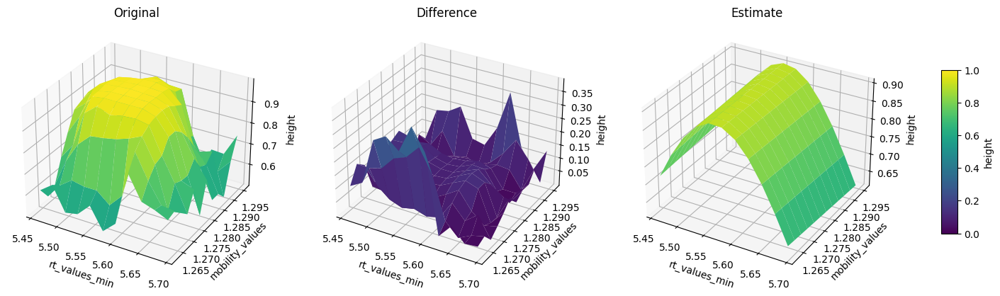

In [ ]:
plot(params_skew_normal, skew_normal_mvd)

#### Pearson type IV as general distributions

The normal distribution is the limit

##### IV

\begin{equation}
\rho_i(y) \propto\left(1+y_i^2 / \nu_i\right)^{-m_i} \exp \left(n_i \arctan \left(y_i / \sqrt{\nu_i}\right)\right)
\end{equation}

In [ ]:
# params = [alpha, zeta(n), m(n)>0, n(n), nu(n)>0, A(n×n)]
num_params = 1 + n + n + n + n + n*n
params = tf.Variable(tf.random.normal([num_params], stddev=0.1), name="pearsonIV")

def pearsonIV_mvd(params, X):
    alpha = params[0]
    zeta   = params[1:1+n]
    m      = tf.nn.softplus(params[1+n:1+2*n])         # m>0
    npar   = params[1+2*n:1+3*n]                       # n real
    nu     = tf.nn.softplus(params[1+3*n:1+4*n])       # ν>0
    A_flat = params[1+4*n:]
    A      = tf.reshape(A_flat,(n,n))

    Y = tf.matmul(X - zeta, A, transpose_b=True)

    # pearson IV
    term1 = (1 + (Y**2)/nu)**(-m)
    term2 = tf.exp(npar * tf.atan(Y/tf.sqrt(nu)))
    rho_i = term1 * term2
    rho = alpha * tf.reduce_prod(rho_i, axis=1)
    return rho


In [ ]:
params_pearson_IV = train(params, pearsonIV_mvd)

Epoch    0, Loss = 8.125879e-01, Best Loss = 8.125879e-01
Epoch  200, Loss = 3.374092e-02, Best Loss = 3.374092e-02
Epoch  400, Loss = 3.350196e-02, Best Loss = 3.350196e-02
Epoch  600, Loss = 3.326647e-02, Best Loss = 3.326647e-02
Epoch  800, Loss = 3.301694e-02, Best Loss = 3.301694e-02
Epoch 1000, Loss = 3.269685e-02, Best Loss = 3.269685e-02
Epoch 1200, Loss = 3.212189e-02, Best Loss = 3.212189e-02
Epoch 1400, Loss = 3.191777e-02, Best Loss = 3.155507e-02
Epoch 1600, Loss = 3.128123e-02, Best Loss = 3.128123e-02
Epoch 1800, Loss = 4.160571e-02, Best Loss = 2.973815e-02
Epoch 2000, Loss = 2.954860e-02, Best Loss = 2.954860e-02
Epoch 2200, Loss = 2.706228e-02, Best Loss = 2.706228e-02
Epoch 2400, Loss = 2.649442e-02, Best Loss = 2.649442e-02
Epoch 2600, Loss = 2.641278e-02, Best Loss = 2.641199e-02
Epoch 2800, Loss = 2.633567e-02, Best Loss = 2.633567e-02
Epoch 3000, Loss = 2.636185e-02, Best Loss = 2.626652e-02
Epoch 3200, Loss = 2.618508e-02, Best Loss = 2.618508e-02
Epoch 3400, Lo

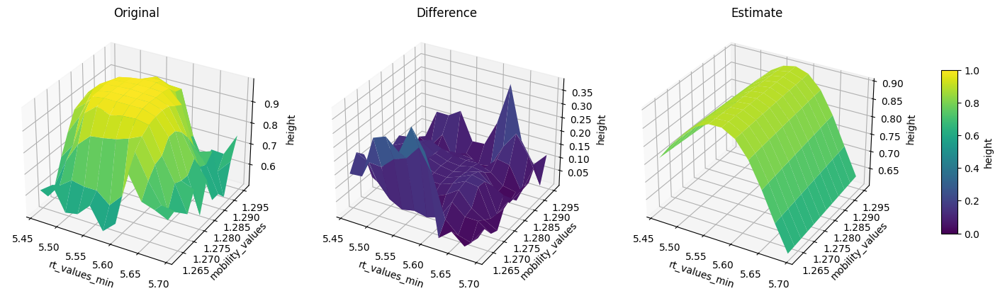

In [ ]:
plot(params_pearson_IV, pearsonIV_mvd)

#### Johnson $S_U$ with matrixvalued $\delta$

In [52]:
# --- 2. Parameter als trainierbare Variablen ---
dimensions = 2
number_parameters = 2 * dimensions ** 2 + 2*dimensions + 1
params = tf.Variable(tf.random.normal([number_parameters], stddev=0.1), name="params")

# --- 3. Modell- und Fehlerfunktion definieren ---
def jsu_likelihood2(params, X):
    
    # parameter length
    n = int(-3/2+ np.sqrt(5/4 + len(params.numpy())))
    # 0: alpha
    alpha = params[0]
    # gamma
    gamma = params[1:1+n]
    # zeta
    zeta = params[1+n:1+2*n]
    # delta (absolut)
    delta_sqrt = tf.reshape(params[1+2*n:1+2*n+n*n], (n,n))
    delta = tf.matmul(delta_sqrt, delta_sqrt, transpose_b = True)

    # A-Matrix (3×3), Q = A·Aᵀ
    A = tf.reshape(params[1+2*n+n*n:], (n, n))
    #Q = tf.matmul(A, A, transpose_b=True)  # Q = A @ A.T

    # Achsentransformation: für jeden Sample-Vektor x: Q @ (x - zeta)
    centered = X - zeta                   # broadcast [N,2] - [2] → [N,2]
    transformed = tf.matmul(centered, A, transpose_b=True)  # [N,2]

    # Komponentendichten
    # rho_i = exp(-0.5*(γ_i + δ_i*asinh(t_i))²) / sqrt(1 + t_i²)
    asinh_t = tf.asinh(transformed)      # [N,2]
    exponent = -0.5 * (gamma + tf.matmul(asinh_t, delta, transpose_b=True))**2  # broadcast [2]→[N,2]
    rho_components = tf.exp(exponent) / tf.sqrt(1 + transformed**2)  # [N,2]

    # Gesamt-Wahrscheinlichkeit: α * ∏ₖ ρₖ
    rho = alpha * tf.reduce_prod(rho_components, axis=1)  # [N]
    return rho

In [56]:
params_jsu2 = train(params, jsu_likelihood2, epochs=50000)

Epoch    0, Loss = 2.369575e-02, Best Loss = 2.369575e-02
Epoch  200, Loss = 2.369529e-02, Best Loss = 2.369529e-02
Epoch  400, Loss = 2.368129e-02, Best Loss = 2.368129e-02
Epoch  600, Loss = 2.367472e-02, Best Loss = 2.367472e-02
Epoch  800, Loss = 2.366719e-02, Best Loss = 2.366719e-02
Epoch 1000, Loss = 2.365836e-02, Best Loss = 2.365836e-02
Epoch 1200, Loss = 2.364816e-02, Best Loss = 2.364816e-02
Epoch 1400, Loss = 2.363657e-02, Best Loss = 2.363657e-02
Epoch 1600, Loss = 2.362354e-02, Best Loss = 2.362354e-02
Epoch 1800, Loss = 2.360905e-02, Best Loss = 2.360905e-02
Epoch 2000, Loss = 2.359303e-02, Best Loss = 2.359303e-02
Epoch 2200, Loss = 2.357618e-02, Best Loss = 2.357618e-02
Epoch 2400, Loss = 2.355927e-02, Best Loss = 2.355927e-02
Epoch 2600, Loss = 2.354338e-02, Best Loss = 2.354305e-02
Epoch 2800, Loss = 2.352908e-02, Best Loss = 2.352703e-02
Epoch 3000, Loss = 2.351257e-02, Best Loss = 2.351109e-02
Epoch 3200, Loss = 2.349859e-02, Best Loss = 2.349604e-02
Epoch 3400, Lo

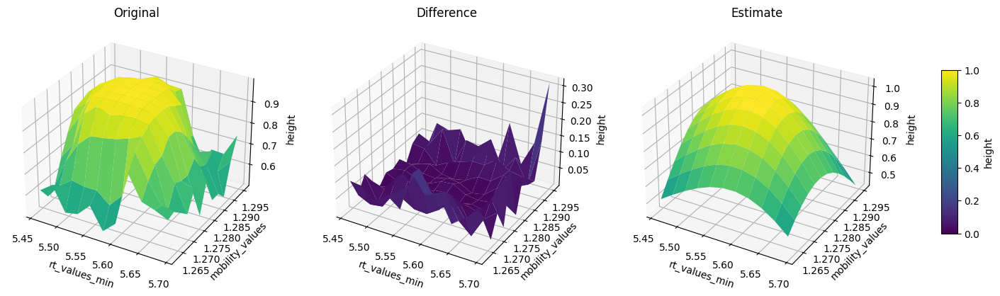

In [57]:
plot(params_jsu2, jsu_likelihood2)